### Packages

In [ ]:
# cd /project/3022057.01/IFA
# module load anaconda3
# source activate IFAenv
# jupyter notebook --no-browser --ip=* --port=8888 --NotebookApp.token=''

import os
import random
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import eigh
from scipy.signal import sawtooth
from sklearn.decomposition import FastICA, PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.manifold import MDS
from sklearn.covariance import LedoitWolf
from sklearn.linear_model import LogisticRegression, LinearRegression, MultiTaskLasso, Lasso, LassoCV, ElasticNet, MultiTaskLassoCV
from sklearn.metrics.pairwise import cosine_similarity
from nilearn import plotting as nplot
from nilearn import image as nimg
from nilearn import datasets, plotting
from nilearn.regions import connected_label_regions
from nilearn import input_data
from nilearn import image as nimg
from nilearn.connectome import ConnectivityMeasure
from pyriemann.estimation import Covariances
from pyriemann.utils.mean import mean_covariance
from pyriemann.utils.tangentspace import tangent_space, untangent_space, log_map_riemann, unupper
from pyriemann.utils.distance import distance_riemann
from pyriemann.utils.base import logm
import torch

### Helper Functions

In [2]:
# https://dartbrains.org/content/Parcellations.html#summary-of-differences-between-parcellations
# https://nipy.org/nibabel/nibabel_images.html
# https://nilearn.github.io/dev/auto_examples/03_connectivity/plot_signal_extraction.html
# https://nilearn.github.io/dev/modules/generated/nilearn.regions.Parcellations.html
# https://dartbrains.org/content/Parcellations.html#nilearn
# https://carpentries-incubator.github.io/SDC-BIDS-fMRI/aio/index.html
def create_mask(dir='../resources/rois/',n_rois=200, yeo_networks=17, resolution_mm=1):
    if dir == '../resources/rois/':
        parcel_dir = dir
        schaefer = datasets.fetch_atlas_schaefer_2018(n_rois,yeo_networks,resolution_mm,data_dir=parcel_dir)
        atlas_schaefer = schaefer['maps']
        atlas = connected_label_regions(atlas_schaefer)
    else:
        atlas = dir
    masker = input_data.NiftiLabelsMasker(labels_img=atlas,
                                        standardize=True)
    atlas_img = nimg.load_img(atlas)
    region_labels = np.unique(atlas_img.get_fdata())
    region_labels = np.setdiff1d(region_labels, [0])

    return masker, atlas, region_labels

In [3]:
def view_labels(atlas,roi = 'a == 1'):
    # View rois
    # nplot.plot_roi(atlas,
    #             cut_coords=(-20,-10,0,10,20,30,40,50,60,70),
    #             display_mode='z',
    #             colorbar=True,
    #             cmap='Paired')
    
    # Make a mask for ROI 44
    roi_mask = nimg.math_img(roi, a=atlas)  
    # Visualize ROI
    nplot.plot_roi(roi_mask, cmap='jet')
    

In [4]:
def view_data_labels(sub_data,region_labels):
    # View sub data at 4th sample
    nplot.view_img(sub_data.slicer[:,:,:,4])
        
    # Resample rois to match sub_data
    print("Size of functional image:", sub_data.shape)
    print("Size of atlas image:", region_labels.shape)
    resampled_schaefer = nimg.resample_to_img(region_labels, sub_data)
    print("Size of resampled atlas image:", resampled_schaefer.shape)

    # View different overlays of roi and subdata at 1000th sample
    nplot.plot_roi(resampled_schaefer, sub_data.slicer[:, :, :, 1000])
    nplot.view_img(resampled_schaefer,sub_data.slicer[:, :, :, 1000])

In [5]:
def parcellate(sub_data, masker, region_labels, verbose=False):
    # Create parcellated data
    parcellated = masker.fit_transform(sub_data)
    num_labels = len(region_labels)
    
    # where t is the number of timepoints
    num_timepoints = sub_data.shape[3]
    # Create an array of zeros that has the correct size
    final_signal = np.zeros((num_timepoints, num_labels))

    # Get regions that are kept
    regions_kept = np.array(masker.labels_,dtype='int')

    # Fill columns matching labels with signal values
    final_signal[:, regions_kept-1] = parcellated
    if verbose:
        print("Number of atlas labels: ", num_labels)
        print("Number of parcellated labels: ", len(masker.labels_))
        print("Missing labels: ", set(region_labels) - set(np.unique(masker.labels_)))
    return final_signal

In [6]:
def parcellate_all(allsubs, mask, region_labels, save=False,verbose=False,location=''):
    main_output_directory = os.path.normpath(r"/project/3022057.01/")

    alldata = []
    for sub in allsubs:
        for task in sub:
            if verbose:
                print(task)
            sub_data = nimg.load_img(task)
            parcellated = parcellate(sub_data, mask, region_labels, verbose=verbose)
            alldata.append(parcellated)
            if save:
                subdir = task[task.find("S1200") + len("S1200"):].split("/")[1]
                taskdir = task[task.find("Results") + len("Results"):].split("/")[1]
                sub_output_directory = os.path.join(main_output_directory, location,subdir)
                os.makedirs(sub_output_directory, exist_ok=True)
                output_filename = os.path.join(sub_output_directory, f"{taskdir}_parcellated.npy")
                print(output_filename)
                np.save(output_filename, parcellated)
    return alldata 

In [7]:
import warnings
def standardize_demean(group):
    if np.isnan(group).any():
        # If NaNs are present, replace them with zeros
        group = np.nan_to_num(group)
        print("Warning: NaNs found in the data. Replacing with zeros.")
        
    preprocessed_group = np.zeros_like(group)

    for i, subject in enumerate(group):
        # parcels_means = np.mean(subject,axis=1,keepdims=True)
        # standardized_subject = subject - parcels_means

        # time_series_means = np.mean(standardized_subject,axis=0,keepdims=True)
        # time_series_std = np.std(standardized_subject,axis=0,ddof=1)
        # standardized_subject = (standardized_subject-time_series_means)/ time_series_std
        
        time_series_means = np.mean(subject,axis=0,keepdims=True)
        time_series_std = np.std(subject,axis=0,ddof=1)
        epsilon = 1e-11
        time_series_std = np.where(time_series_std < epsilon, epsilon, time_series_std)
        with warnings.catch_warnings():
            warnings.filterwarnings('error', category=RuntimeWarning)
            try:
                standardized_subject = (subject - time_series_means) / time_series_std
            except RuntimeWarning as warning:
                print("Warning encountered at subject", i)
                print("RuntimeWarning:", warning)
                print("Values causing the warning:")
                print("time_series_std:", time_series_std)
            
        preprocessed_group[i,:,:] = standardized_subject

    return preprocessed_group


In [8]:
def create_signal(samples, parcels, sig_freqA=.03,sig_freqB=.05, spatial_ratio=.1, type="saw", visualize=False):

    # Create a random subset of parcels to add the signal
    num_parcels_with_signal = int(spatial_ratio * parcels)
    groupA_parcels = np.random.choice(parcels, size=num_parcels_with_signal, replace=False)
    groupB_parcels = np.random.choice(np.setdiff1d(np.arange(parcels), groupA_parcels), size=num_parcels_with_signal, replace=False)

    x = np.linspace(0, samples, num=samples)
    if type == "sin":
        groupA_signal =  np.sin(sig_freqA * x)
        groupB_signal =  sawtooth(sig_freqB * x)
    else:
        groupA_signal =  sawtooth(sig_freqA * x)
        groupB_signal =  np.sin(sig_freqB * x)
    groupA_signal = (groupA_signal-np.mean(groupA_signal))/np.std(groupA_signal)
    groupB_signal = (groupB_signal-np.mean(groupB_signal))/np.std(groupB_signal)

    parcelsA = np.zeros((samples, parcels))
    parcelsB = np.zeros((samples, parcels))
    # Add the signal to the selected parcels
    parcelsA[:, groupA_parcels] += np.reshape(groupA_signal, (-1, 1))
    parcelsB[:, groupB_parcels] += np.reshape(groupB_signal, (-1, 1))

    if visualize:
        # Plot heatmap
        plt.figure(figsize=(12, 12))
        plt.subplot(3,1,1)
        plt.imshow(parcelsA.T, aspect='auto', cmap='viridis', origin='lower')
        plt.colorbar(label='Amplitude')
        plt.title('Heatmap of Genarated Group A fMRI Matrix')
        plt.xlabel('Samples')
        plt.ylabel('Parcels')
        
        plt.subplot(3,1,2)
        plt.imshow(parcelsB.T, aspect='auto', cmap='viridis', origin='lower')
        plt.colorbar(label='Amplitude')
        plt.title('Heatmap of Genarated Group B fMRI Matrix')
        plt.xlabel('Samples')
        plt.ylabel('Parcels')

        # Plot each parcel as a line plot
        plt.subplot(3,1,3)
        plt.plot(groupA_signal,label="Group A Signal")
        plt.plot(groupB_signal,label="Group B Signal")
        plt.title('Signal in Selected Parcels')
        plt.legend()
        plt.xlabel('Samples')
        plt.ylabel('Amplitude')
        plt.tight_layout()
        plt.show()

    return groupA_signal, groupB_signal, groupA_parcels, groupB_parcels

In [9]:
def simulate_data(allsubs_data, sig_freqA=.03,sig_freqB=.5,spatial_ratio=.01, sub_ratio=.5, original_level=0.5, simulateA=True, simulateB=True):
    samples = allsubs_data[0].shape[0]
    parcels = allsubs_data[0].shape[1]
    groupA_simulated_signal, groupB_simulated_signal, groupA_parcels, groupB_parcels = create_signal(samples,parcels, sig_freqA=sig_freqA, sig_freqB=sig_freqB ,spatial_ratio=spatial_ratio,type="saw", visualize=True)
    
    nsubjects = len(allsubs_data)
    nsubjects_semi_simulated = int(nsubjects*sub_ratio)

    selected_subjects = np.random.choice(nsubjects, size=nsubjects_semi_simulated, replace=False)
    unselected_subjects = np.array(np.setdiff1d(np.arange(nsubjects),selected_subjects))

    groupA_data = allsubs_data[selected_subjects,:,:].copy()
    groupB_data = allsubs_data[unselected_subjects,:,:].copy()
    
    if simulateA:
        for i, subject in enumerate(groupA_data):
            for parcel in groupA_parcels:
                subjectA_signal = ((subject[:,parcel]-np.mean(subject[:,parcel]))/np.std(subject[:,parcel]))
                # subjectB_signal = ((subject[:,parcel]-np.mean(subject[:,parcel]))/np.std(subject[:,parcel]))

                groupA_data[i,:,parcel] = np.sqrt(original_level)*subjectA_signal + np.sqrt(1-original_level)*groupA_simulated_signal
                # groupB_data[i,:,parcel] = np.sqrt(original_level)*subjectB_signal + np.sqrt(1-original_level)*np.random.randn(samples)

    if simulateB:
        for i, subject in enumerate(groupB_data):
            for parcel in groupB_parcels:
                subjectB_signal = ((subject[:,parcel]-np.mean(subject[:,parcel]))/np.std(subject[:,parcel]))
                # subjectA_signal = ((subject[:,parcel]-np.mean(subject[:,parcel]))/np.std(subject[:,parcel]))

                groupB_data[i,:,parcel] = np.sqrt(original_level)*subjectB_signal + np.sqrt(1-original_level)*groupB_simulated_signal
                # groupA_data[i,:,parcel] = np.sqrt(original_level)*subjectA_signal + np.sqrt(1-original_level)*np.random.randn(samples)

                
    return groupA_data, groupB_data, groupA_parcels, groupB_parcels

In [10]:
def load(n=0,folder1=0,folder2=-1):
    # Min and max number of subjects
    if n < 0:
        n = 0
    elif n > 1113:
        n = 1113

    # Define the directory where the data is stored
    base_directory = "/project_cephfs/3022017.01/S1200"
    subdirectory = "MNINonLinear/Results"
    
    # Define the list of folders for rfMRI and tfMRI
    folders = ["rfMRI_REST1_LR","rfMRI_REST1_RL","rfMRI_REST2_LR","rfMRI_REST2_RL","tfMRI_EMOTION_LR",
                    "tfMRI_EMOTION_RL","tfMRI_GAMBLING_LR","tfMRI_GAMBLING_RL","tfMRI_LANGUAGE_LR","tfMRI_LANGUAGE_RL",
                        "tfMRI_MOTOR_LR", "tfMRI_MOTOR_RL", "tfMRI_RELATIONAL_LR", "tfMRI_RELATIONAL_RL", "tfMRI_SOCIAL_LR",
                            "tfMRI_SOCIAL_RL", "tfMRI_WM_LR", "tfMRI_WM_RL"]
    
    # Randomly select n subjects without repetition
    selected_subjects = set()
    while len(selected_subjects) < n:
        subject = random.choice(os.listdir(base_directory))
        subject_data1 = os.path.join(base_directory, subject, subdirectory, folders[folder1], folders[folder1] + ".nii.gz")

        # Check if the file exists before adding the subject
        if os.path.exists(subject_data1):
            if folder2 > 0:
                subject_data2 = os.path.join(base_directory, subject, subdirectory, folders[folder2],folders[folder2] + ".nii.gz")
                # Check if the second file exists before adding it
                if os.path.exists(subject_data2):
                    selected_subjects.add((subject_data1, subject_data2))
            else:
                selected_subjects.add((subject_data1,))

    return [list(sub) for sub in selected_subjects]

In [11]:
def numerical_stability(groupA_cov, groupB_cov):
    
    # Method 1
    C = groupA_cov+groupB_cov
    eigs, vecs = eigh(C)
    P = np.diag(np.power(eigs,-.5))@vecs.T
    S1 = P@groupA_cov@P.T
    S2 = P@groupB_cov@P.T

    groupA_eigs1, groupA_filters1 = eigh(S1,eigvals_only=False)
    groupB_eigs1, groupB_filters1 = eigh(S2,eigvals_only=False)

    # Method 2
    groupA_eigs2, groupA_filters2 = eigh(np.linalg.inv(groupA_cov+groupB_cov)@groupA_cov,eigvals_only=False)
    groupB_eigs2, groupB_filters2 = eigh(np.linalg.inv(groupA_cov+groupB_cov)@groupB_cov,eigvals_only=False)

    # Method 3
    groupA_eigs3, groupA_filters3 = eigh(groupA_cov, groupA_cov+groupB_cov,eigvals_only=False)
    groupB_eigs3, groupB_filters3 = eigh(groupB_cov, groupA_cov+groupB_cov,eigvals_only=False)

    return  groupA_eigs1, groupA_filters1, groupB_eigs1, groupB_filters1, groupA_eigs2, groupA_filters2, groupB_eigs2, groupB_filters2, groupA_eigs3, groupA_filters3, groupB_eigs3, groupB_filters3
    

In [12]:
from sklearn.base import BaseEstimator, ClassifierMixin, RegressorMixin
from sklearn.utils.extmath import safe_sparse_dot
from sklearn.isotonic import isotonic_regression
from sklearn.preprocessing import LabelBinarizer

def squared_loss(y_true, y_pred, return_derivative=False):
    diff = y_pred - y_true
    obj = 0.5 * np.dot(diff, diff)
    if return_derivative:
        return obj, diff
    else:
        return obj


def squared_hinge_loss(y_true, y_scores, return_derivative=False):
    # labels in (-1, 1)
    z = np.maximum(0, 1 - y_true * y_scores)
    obj = np.sum(z ** 2)

    if return_derivative:
        return obj, -2 * y_true * z
    else:
        return obj


def get_loss(name):
    losses = {'squared': squared_loss,
              'squared-hinge': squared_hinge_loss}
    return losses[name]

def fista(sfunc, nsfunc, x0, max_iter=500, max_linesearch=20, eta=2.0, tol=1e-3,
          verbose=0):

    y = x0.copy()
    x = y
    L = 1.0
    t = 1.0

    for it in range(max_iter):
        f_old, grad = sfunc(y, True)

        for ls in range(max_linesearch):
            y_proj = nsfunc(y - grad / L, L)
            diff = (y_proj - y).ravel()
            sqdist = np.dot(diff, diff)
            dist = np.sqrt(sqdist)

            F = sfunc(y_proj)
            Q = f_old + np.dot(diff, grad.ravel()) + 0.5 * L * sqdist

            if F <= Q:
                break

            L *= eta

        if ls == max_linesearch - 1 and verbose:
            print("Line search did not converge.")

        if verbose:
            print("%d. %f" % (it + 1, dist))

        if dist <= tol:
            if verbose:
                print("Converged.")
            break

        x_next = y_proj
        t_next = (1 + np.sqrt(1 + 4 * t ** 2)) / 2.
        y = x_next + (t-1) / t_next * (x_next - x)
        t = t_next
        x = x_next

    return y_proj

def prox_owl(v, w):
    """Proximal operator of the OWL norm dot(w, reversed(sort(v)))

    Follows description and notation from:
    X. Zeng, M. Figueiredo,
    The ordered weighted L1 norm: Atomic formulation, dual norm,
    and projections.
    eprint http://arxiv.org/abs/1409.4271
    """

    # wlog operate on absolute values
    v_abs = np.abs(v)
    ix = np.argsort(v_abs)[::-1]
    v_abs = v_abs[ix]
    # project to K+ (monotone non-negative decreasing cone)
    v_abs = isotonic_regression(v_abs - w, y_min=0, increasing=False)

    # undo the sorting
    inv_ix = np.zeros_like(ix)
    inv_ix[ix] = np.arange(len(v))
    v_abs = v_abs[inv_ix]

    return np.sign(v) * v_abs


def _oscar_weights(alpha, beta, size):
    w = np.arange(size - 1, -1, -1, dtype=np.double)
    w *= beta
    w += alpha
    return w


def _fit_owl_fista(X, y, w, loss, max_iter=500, max_linesearch=20, eta=2.0,
                   tol=1e-3, verbose=0):

    # least squares loss
    def sfunc(coef, grad=False):
        y_scores = safe_sparse_dot(X, coef)
        if grad:
            obj, lp = loss(y, y_scores, return_derivative=True)
            grad = safe_sparse_dot(X.T, lp)
            return obj, grad
        else:
            return loss(y, y_scores)

    def nsfunc(coef, L):
        return prox_owl(coef, w / L)

    coef = np.zeros(X.shape[1])
    return fista(sfunc, nsfunc, coef, max_iter, max_linesearch,
                 eta, tol, verbose)


class _BaseOwl(BaseEstimator):
    """

    Solves sum loss(y_pred, y) + sum_j weights_j |coef|_(j)
           where u_(j) is the jth largest component of the vector u.
           and weights is a monotonic nonincreasing vector.

    OWL is also known as: sorted L1 norm, SLOPE

    Parameters
    ----------

    weights: array, shape (n_features,) or tuple, length 2
        Nonincreasing weights vector for the ordered weighted L1 penalty.
        If weights = (alpha, 0, 0, ..., 0), this amounts to a L_inf penalty.
        If weights = alpha * np.ones(n_features) it amounts to L1.
        If weights is a tuple = (alpha, beta), the OSCAR penalty is used::
            alpha ||coef||_1 + beta sum_{i<j} max{|x_i|, |x_j|)
        by computing the corresponding `weights` vector as::
            weights_i = alpha + beta(n_features - i - 1)

    loss: string, default: "squared"
        Loss function to use, see loss.py to add your own.

    max_iter: int, default: 500
        Maximum FISTA iterations.

    max_linesearch: int, default: 20
        Maximum number of FISTA backtracking line search steps.

    eta: float, default: 2
        Amount by which to increase step size in FISTA bactracking line search.

    tol: float, default: 1e-3
        Tolerance for the convergence criterion.

    verbose: int, default 0:
        Degree of verbosity to print from the solver.

    References
    ----------
        X. Zeng, M. Figueiredo,
        The ordered weighted L1 norm: Atomic formulation, dual norm,
        and projections.
        eprint http://arxiv.org/abs/1409.4271
    """

    def __init__(self, weights, loss='squared', max_iter=500,
                 max_linesearch=20, eta=2.0, tol=1e-3, verbose=0):
        self.weights = weights
        self.loss = loss
        self.max_iter = max_iter
        self.max_linesearch = max_linesearch
        self.eta = eta
        self.tol = tol
        self.verbose = verbose

    def fit(self, X, y):

        n_features = X.shape[1]

        loss = self.get_loss()
        weights = self.weights
        if isinstance(weights, tuple) and len(weights) == 2:
            alpha, beta = self.weights
            weights = _oscar_weights(alpha, beta, n_features)

        self.coef_ = _fit_owl_fista(X, y, weights, loss, self.max_iter,
                                    self.max_linesearch, self.eta, self.tol,
                                    self.verbose)
        return self

    def _decision_function(self, X):
        return safe_sparse_dot(X, self.coef_)


class OwlRegressor(_BaseOwl, RegressorMixin):
    """Ordered Weighted L1--penalized (OWL) regression solved by FISTA"""
    __doc__ += _BaseOwl.__doc__

    def get_loss(self):
        if self.loss != 'squared':
            raise NotImplementedError('Only regression loss implemented '
                                      'at the moment is squared.')

        return get_loss(self.loss)

    def predict(self, X):
        return self._decision_function(X)

In [13]:
def FKT_proj(data, filters, method="basic", alpha=1, beta=0, l1_ratio=0.5, lambda1=.01, lambda2=.01):
    S = (data @ filters)
    
    if method == "basic":
        proj = S.T @ data
    elif method == "covs":
        cov_est_scm = Covariances(estimator='scm')
        s_cov = cov_est_scm.transform(S.T[np.newaxis,:,:])[0,:,:]
        data_cov = cov_est_scm.transform(data.T[np.newaxis,:,:])[0,:,:]
        proj = (data_cov @ filters @ np.linalg.inv(s_cov)).T
    elif method == "linreg":
        reg = LinearRegression()
        reg.fit(S, data)
        proj = reg.coef_.T
    elif method == "grouplassolinreg":
        reg = MultiTaskLasso(alpha=alpha)  # Using 5-fold cross-validation
        reg.fit(S, data)
        proj = reg.coef_.T
    elif method == "lassolinreg":
        reg = Lasso(alpha=alpha)  # Using 5-fold cross-validation
        reg.fit(S, data)
        proj = reg.coef_.T
    elif method == "elasticlinreg":
        reg = ElasticNet(alpha=alpha, l1_ratio=l1_ratio)
        reg.fit(S, data)
        proj = reg.coef_.T
    elif method == "growl":
        # Proximal Operator for GrOWL targeting columns
        def prox_growl(V, lambda1, lambda2, tau):
            p, r = V.shape
            norms = np.linalg.norm(V, axis=0)  # Norms of columns
            indices = np.argsort(-norms)  # Sort indices by descending norms
            weights = lambda1 + lambda2 * np.linspace(1, 0, r)  # Weights decrease
            V_new = np.zeros_like(V)
            for i in range(r):
                idx = indices[i]
                if norms[idx] > weights[i] * tau:
                    V_new[:, idx] = (1 - tau * weights[i] / norms[idx]) * V[:, idx]
            return V_new
        
        # Initialization
        B = np.zeros((filters.shape[1], data.shape[1]))
        
        # Optimization Loop
        max_iter = 100
        learning_rate = 0.01
        for _ in range(max_iter):
            gradient = S.T @ (S @ B - data)
            B -= learning_rate * gradient
            B = prox_growl(B, lambda1, lambda2, tau=learning_rate)
            if np.linalg.norm(gradient) < 1e-1:
                break
        
        proj = B.T
    
    return proj

In [14]:
def visualize(all_filters, preprocessed_GroupA,preprocessed_GroupB):
     # Create a figure and axes for subplots
    fig, axes = plt.subplots(all_filters.shape[1], 1, figsize=(6, 4*all_filters.shape[1]))

    # Iterate over each axis of filters
    for i in range(all_filters.shape[1]):
        # Access the subplot using indexing
        if all_filters.shape[1] == 1:
            ax = axes
        else:
            ax = axes[i]

        # Calculate the outer product image for the current axis
        outer_product = all_filters[:, i:i+1]@ all_filters[:, i:i+1].T

        # Plot the outer product image on the corresponding subplot
        im = ax.imshow(outer_product, aspect='auto', cmap='viridis', origin='lower')
        ax.set_title(f"Outer Product for Axis {i}")
        fig.colorbar(im, ax=ax, label='Amplitude')

        plt.tight_layout()
    plt.show()

    groupA_subject = preprocessed_GroupA[np.random.choice(range(preprocessed_GroupA.shape[0])),:,:]
    groupB_subject = preprocessed_GroupB[np.random.choice(range(preprocessed_GroupB.shape[0])),:,:]
    reduced_A = groupA_subject@all_filters
    reduced_B = groupB_subject@all_filters
    # Create a line plot for reduced_covs_A
    plt.figure(figsize=(8, 6))
    for i in range(reduced_A.shape[1]):
        plt.plot(reduced_A[:, i], label=f'Column {i+1}')
    plt.title('Group A')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()  # Display the labels
    plt.show()

    # Create a line plot for reduced_covs_B
    plt.figure(figsize=(8, 6))
    for i in range(reduced_B.shape[1]):
        plt.plot(reduced_B[:, i], label=f'Column {i+1}')
    plt.title('Group B')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()  # Display the labels
    plt.show()

In [15]:
from sklearn.svm import SVC  # For SVM classification
from sklearn.model_selection import train_test_split  # For splitting data
from sklearn.metrics import accuracy_score  # For evaluating performance

# def tangent_CSP(group1_covs, group2_covs,k=1):    
#     all_covs = np.concatenate((group1_covs, group2_covs))
#     Frechet_Mean = mean_covariance(all_covs, metric='riemann')
#     tangent_projected_1 = tangent_space(group1_covs, Frechet_Mean, metric="riemann")
#     tangent_projected_2 = tangent_space(group2_covs, Frechet_Mean, metric="riemann")

#     # Initialize the Covariances estimator
#     cov_estimator = Covariances(estimator='lwf')
#     tangent_projected_mean = np.mean(np.concatenate((tangent_projected_1, tangent_projected_2)),axis=0,keepdims=True)  
    
#     tangent_1_mean = np.mean(tangent_projected_1,axis=0,keepdims=True) - tangent_projected_mean
#     tangent_2_mean = np.mean(tangent_projected_2,axis=0,keepdims=True) - tangent_projected_mean
#     tangent_between_scatter = tangent_1_mean.T@tangent_1_mean + tangent_2_mean.T@tangent_2_mean
    
#     # Estimate the covariance matrices
#     cov_tangent_projected_1 = cov_estimator.transform(np.transpose(tangent_projected_1[np.newaxis,:,:],(0,2,1)))[0]
#     cov_tangent_projected_2 = cov_estimator.transform(np.transpose(tangent_projected_2[np.newaxis,:,:],(0,2,1)))[0]
    
#     print(cov_tangent_projected_1.shape)
#     print(cov_tangent_projected_2.shape)
#     print(tangent_between_scatter.shape)
#     # Convert to PyTorch tensors and move to GPU
#     device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#     print(("cuda" if torch.cuda.is_available() else "cpu"))
#     cov_tangent_projected_1 = torch.tensor(cov_tangent_projected_1, dtype=torch.float32, device=device)
#     cov_tangent_projected_2 = torch.tensor(cov_tangent_projected_2, dtype=torch.float32, device=device) 
#     tangent_between_scatter = torch.tensor(tangent_between_scatter, dtype=torch.float32, device=device)
    
#     # For filtersA
#     eigs_A, eigvecs_A = torch.lobpcg(tangent_between_scatter, B=cov_tangent_projected_1 + cov_tangent_projected_2 + .1 * torch.eye(cov_tangent_projected_1.shape[0], device=cov_tangent_projected_1.device), k=k, largest=True)
#     eigs_array_A = eigs_A.clone().cpu().numpy()
#     eigvecs_array_A = eigvecs_A.clone().cpu().numpy()

#     # For filtersB
#     # eigs_B, eigvecs_B = torch.lobpcg(tangent_between_scatter, B=cov_tangent_projected_2, k=k, largest=True)
#     # eigs_array_B = eigs_B.clone().cpu().numpy()
#     # eigvecs_array_B = eigvecs_B.clone().cpu().numpy()
#     # eigs_array_A, eigvecs_array_A = eigh(tangent_between_scatter,cov_tangent_projected_1,eigvals_only=False,subset_by_index=[0,k-1])
#     # eigs_array_B, eigvecs_array_B = eigh(tangent_between_scatter,cov_tangent_projected_2,eigvals_only=False,subset_by_index=[0,k-1])
#     projection_matrix = np.linalg.pinv(eigvecs_array_A.T)@eigvecs_array_A.T
#     discrimA = untangent_space(tangent_projected_1@projection_matrix,Frechet_Mean)
#     discrimB = untangent_space(tangent_projected_2@projection_matrix,Frechet_Mean)
#     return(
#         # eigs_array_A,
#         eigvecs_array_A,
#         untangent_space(eigvecs_array_A.T, Frechet_Mean),
#         untangent_space(-eigvecs_array_A.T, Frechet_Mean),
#         Frechet_Mean,
#         discrimA,
#         discrimB
#     )

def FKT(groupA_cov_matrices, groupB_cov_matrices, mean="riemann", average=True, threshold=.9, visualize=True, gamma=0.0):
    if average:
        groupA_cov = mean_covariance(groupA_cov_matrices, metric=mean)
        groupB_cov = mean_covariance(groupB_cov_matrices, metric=mean)    
        groupA_eigs, groupA_filters = eigh(groupA_cov, groupA_cov + groupB_cov + gamma*np.identity(groupB_cov.shape[0]),eigvals_only=False)
        # groupB_eigs, groupB_filters = eigh(groupB_cov, groupA_cov + groupB_cov + gamma*np.identity(groupB_cov.shape[0]),eigvals_only=False)
    else:
        groupA_eigs, groupA_filters = eigh(groupA_cov_matrices, groupA_cov_matrices + groupB_cov_matrices,eigvals_only=False)
        # groupB_eigs, groupB_filters = eigh(groupB_cov_matrices, groupA_cov_matrices,eigvals_only=False)
  
    # Concatenate eigenvalues and eigenvectors for each group
    # all_eigs = np.concatenate((groupB_eigs[::-1], groupA_eigs), axis=0)
    # all_filters = np.concatenate((groupB_filters[:,::-1], groupA_filters), axis=1)

    all_eigs = groupA_eigs
    fkt_eigsT_adjusted  = np.abs(np.log(all_eigs/(1-all_eigs)))**2
    eiglist = np.argsort(fkt_eigsT_adjusted)[::-1]
    sum = 0.0
    support_distance = []
    for i in range(0,len(eiglist)):
        sum += fkt_eigsT_adjusted[eiglist[i]]
        support_distance.append(eiglist[i])
        if sum/np.sum(fkt_eigsT_adjusted) > threshold:
            break
            
    if visualize:
        plt.figure()
        plt.scatter(range(0,fkt_eigsT_adjusted.shape[0]),fkt_eigsT_adjusted)
        plt.title(f'Scree Plot of FKT Filters')
        plt.xlabel('Eig Value Rank')
        plt.ylabel('Eig Value')
        plt.show()
        
        # plt.figure()
        # plt.scatter(np.linspace(0,all_eigs.shape[0],num=all_eigs.shape[0]), np.diag(all_filters.T@groupA_cov@all_filters), c="red", label='Eigenvalues of filters for Group A')  # Labeling red points as Group A
        # plt.scatter(np.linspace(0,all_eigs.shape[0],num=all_eigs.shape[0]), np.diag(all_filters.T@groupB_cov@all_filters), c="blue", label='Eigenvalues of filters for Group B')  # Labeling red points as Group A
        # plt.xlabel('Filter Number')
        # plt.ylabel('Eigenvalue of Filter for Covariance Matrices')
        # plt.title('Var of Subjects Projected onto Filters')
        # plt.legend()
        # plt.show()
        
    return all_eigs,groupA_filters, fkt_eigsT_adjusted

def tangent_CSP(group1_covs, group2_covs,k=1):    
    all_covs = np.concatenate((group1_covs, group2_covs))
    Frechet_Mean = mean_covariance(all_covs, metric='riemann')
    tangent_projected_1 = tangent_space(group1_covs, Frechet_Mean, metric="riemann")
    tangent_projected_2 = tangent_space(group2_covs, Frechet_Mean, metric="riemann")

    # Initialize the Covariances estimator
    cov_estimator = Covariances(estimator='lwf')
    tangent_projected_mean = np.mean(np.concatenate((tangent_projected_1, tangent_projected_2)),axis=0,keepdims=True)  
    
    tangent_1_mean = np.mean(tangent_projected_1,axis=0,keepdims=True) - tangent_projected_mean
    tangent_2_mean = np.mean(tangent_projected_2,axis=0,keepdims=True) - tangent_projected_mean
    tangent_between_scatter = tangent_1_mean.T@tangent_1_mean + tangent_2_mean.T@tangent_2_mean
    
    # Estimate the covariance matrices
    cov_tangent_projected_1 = cov_estimator.transform(np.transpose(tangent_projected_1[np.newaxis,:,:],(0,2,1)))[0]
    cov_tangent_projected_2 = cov_estimator.transform(np.transpose(tangent_projected_2[np.newaxis,:,:],(0,2,1)))[0]
    
    # print(cov_tangent_projected_1.shape)
    # print(cov_tangent_projected_2.shape)
    # print(tangent_between_scatter.shape)
    # Convert to PyTorch tensors and move to GPU
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(("cuda" if torch.cuda.is_available() else "cpu"))
    cov_tangent_projected_1 = torch.tensor(cov_tangent_projected_1, dtype=torch.float32, device=device)
    cov_tangent_projected_2 = torch.tensor(cov_tangent_projected_2, dtype=torch.float32, device=device) 
    tangent_between_scatter = torch.tensor(tangent_between_scatter, dtype=torch.float32, device=device)
    
    # For filtersA
    eigs_A, eigvecs_A = torch.lobpcg(tangent_between_scatter, B=cov_tangent_projected_1 + cov_tangent_projected_2 + 0.0 * torch.eye(cov_tangent_projected_1.shape[0], device=cov_tangent_projected_1.device), k=k, largest=True)
    eigvecs_array_A = eigvecs_A.clone().cpu().numpy()
    filtersA = untangent_space(eigvecs_array_A.T, Frechet_Mean)
    fkt_eigsT, fkt_filtersT, maxdiscrimT = FKT(filtersA[0,:,:], Frechet_Mean, mean="riemann", average=False, threshold=.99, visualize=True, gamma=0.0)

    return fkt_filtersT, maxdiscrimT

def tangent_classifier(group1_covs, group2_covs):    
    all_covs = np.concatenate((group1_covs, group2_covs))
    Frechet_Mean = mean_covariance(all_covs, metric='riemann')
    tangent_projected_1 = tangent_space(group1_covs, Frechet_Mean, metric="riemann")
    tangent_projected_2 = tangent_space(group2_covs, Frechet_Mean, metric="riemann")
    # Create labels for each group
    labels_1 = np.zeros(len(tangent_projected_1))  # Labels for group 1
    labels_2 = np.ones(len(tangent_projected_2))   # Labels for group 2

    # Combine data and labels
    data = np.concatenate((tangent_projected_1, tangent_projected_2))
    labels = np.concatenate((labels_1, labels_2))
    # Create SVM classifier (adjust kernel and parameters as needed)
    clf = SVC(kernel='linear')  

    # Train the classifier
    clf.fit(data, labels)
    eigvecs_array_A = clf.coef_.T
   
    projection_matrix = np.linalg.pinv(eigvecs_array_A.T)@eigvecs_array_A.T
    discrimA = untangent_space(tangent_projected_1@projection_matrix,Frechet_Mean)
    discrimB = untangent_space(tangent_projected_2@projection_matrix,Frechet_Mean)
    return(
        # eigs_array_A,
        eigvecs_array_A,
        untangent_space(eigvecs_array_A.T, Frechet_Mean),
        untangent_space(-eigvecs_array_A.T, Frechet_Mean),
        Frechet_Mean,
        discrimA,
        discrimB
    )

In [15]:
from scipy.linalg import subspace_angles
from scipy.sparse import csr_matrix

def supervised_dim_reduction_optimized(group1_covs, group2_covs, Riem1, Riem2, m, nw, nb, max_iter=100, tol=1e-6):
    # Create labels for groupA and groupB
    y_groupA = [0] * len(group1_covs)
    y_groupB = [1] * len(group2_covs)

    # Combine the covariance matrices and labels
    X = np.vstack((group1_covs, group2_covs))
    y = y_groupA + y_groupB

    n = X[0].shape[0]
    W = np.eye(n, m)
    
    # Precompute the logarithm of covariance matrices
    X_log = [logm(Xi) for Xi in X]
    
    # Compute the affinity matrix
    A = np.zeros((len(X), len(X)))
    
    for i in range(len(X)):
        Xi = X[i]
        yi = y[i]
        
        # Compute distances to all other matrices
        distances = [distance_riemann(Xi, Xj) for Xj in X]
        
        # Find indices of matrices with the same label
        same_label_indices = [j for j in range(len(X)) if y[j] == yi and j != i]
        
        # Find indices of matrices with different labels
        diff_label_indices = [j for j in range(len(X)) if y[j] != yi]
        
        # Compute within-class affinities
        same_label_distances = [distances[j] for j in same_label_indices]
        same_label_indices_sorted = sorted(range(len(same_label_distances)), key=lambda k: same_label_distances[k])
        for j in same_label_indices_sorted[:nw]:
            A[i, same_label_indices[j]] = 1
        
        # Compute between-class affinities
        diff_label_distances = [distances[j] for j in diff_label_indices]
        diff_label_indices_sorted = sorted(range(len(diff_label_distances)), key=lambda k: diff_label_distances[k])
        for j in diff_label_indices_sorted[:nb]:
            A[i, diff_label_indices[j]] = -1
    
    # Plot the mask
    plt.figure(figsize=(6, 6))
    plt.imshow(A, cmap='hot', interpolation='nearest')
    plt.title('Mask')
    plt.colorbar()
    plt.show()
    
    # Convert affinity matrix to sparse matrix
    A_sparse = csr_matrix(A)
    
    for i in range(max_iter):
        # Vectorized computation of F using matrix multiplication
        F = sum(A_sparse[i, j] * (X_log[i] - X_log[j]) @ W @ W.T @ (X_log[i] - X_log[j]) for i, j in zip(*A_sparse.nonzero()))

        _, eigvecs = eigh(F, subset_by_index=[0, m-1])
        W_new = eigvecs[:, :m]

        principal_angles = subspace_angles(W_new, W)
        grassmann_distance = np.sqrt(np.sum(np.sin(principal_angles) ** 2))
        print(i)
        if grassmann_distance < tol:
            break

        W = W_new
        X = [Xi @ W @ W.T for Xi in X]
    
    W_eigs = []

    for i in range(0,W.shape[1]):
        W_eigs.append(np.log(W[:,i:i+1].T@Riem1@W[:,i:i+1]) - np.log(W[:,i:i+1].T@Riem2@W[:,i:i+1]))
    W_eigs = np.squeeze(np.array(W_eigs))
    fkt_eigsT_adjusted  = np.abs(W_eigs)**2
    eiglist = np.argsort(fkt_eigsT_adjusted)[::-1]
    W_eigs_sum = 0.0
    support_distance = []
    for i in range(0,len(eiglist)):
        W_eigs_sum += fkt_eigsT_adjusted[eiglist[i]]
        support_distance.append(eiglist[i])
        if W_eigs_sum/np.sum(fkt_eigsT_adjusted) > .5:
            break
                
    if visualize:
        plt.figure()
        plt.scatter(range(0,fkt_eigsT_adjusted.shape[0]),fkt_eigsT_adjusted[eiglist])
        plt.title(f'Scree Plot of FKT Filters')
        plt.xlabel('Eig Value Rank')
        plt.ylabel('Eig Value')
        plt.show()

    return W, support_distance

In [16]:
def TSSF(groupA_covs, groupB_covs, preprocessed_GroupA, preprocessed_GroupB, k=2, visualize=True):
    all_covs = np.concatenate((groupA_covs, groupB_covs))
    Frechet_Mean = mean_covariance(all_covs, metric='riemann')
    tangent_projected = tangent_space(all_covs, Frechet_Mean, metric="riemann")

    labels = np.concatenate((np.zeros(groupA_covs.shape[0]), np.ones(groupB_covs.shape[0])))
    clf = LinearDiscriminantAnalysis()
    clf.fit(tangent_projected, labels)
    weights = clf.coef_
    Cw = np.squeeze(untangent_space(weights, Frechet_Mean, metric="riemann"))
    d, V = eigh(Cw, Frechet_Mean)
    inds = np.argsort(np.abs(np.log(d)))[::-1]
    F = V[:, inds]
    beta = np.log(d[inds])
    if visualize:
        reduced_A = preprocessed_GroupA@F[:,:k]
        reduced_B = preprocessed_GroupB@F[:,:k]
        reduced_covs_A = []
        for subject in reduced_A:
            lw = LedoitWolf()
            lw.fit(subject)
            reduced_covs_A.append(beta[0:k,np.newaxis].T@np.diag(log_map_riemann(lw.covariance_, np.eye(lw.covariance_.shape[0]))))
        reduced_covs_A = np.array(reduced_covs_A)

        reduced_covs_B = []
        for subject in reduced_B:
            lw = LedoitWolf()
            lw.fit(subject)
            reduced_covs_B.append(beta[0:k,np.newaxis].T@np.diag(log_map_riemann(lw.covariance_, np.eye(lw.covariance_.shape[0]))))
        reduced_covs_B = np.array(reduced_covs_B)

        # Create a scatter plot for reduced_covs_A
        plt.scatter(reduced_covs_A[:, 0], np.ones(reduced_covs_A.shape[0]), label='Group A')
        plt.scatter(reduced_covs_B[:, 0], np.zeros(reduced_covs_B.shape[0]), label='Group B')
        plt.legend()
        plt.show()
    return V, d

In [17]:
def f_test(fkt_filters,reshaped_preprocessed_subjects, preprocessed_GroupA, preprocessed_GroupB, verbose=True):
    n_fkt = fkt_filters.shape[1]

    # Now assuming time points are features for Spatial ICA
    mean_per_feature = np.mean(reshaped_preprocessed_subjects, axis=1, keepdims=True)
    demean_preprocessed = reshaped_preprocessed_subjects - mean_per_feature
    std_per_feature = np.std(reshaped_preprocessed_subjects, axis=1, ddof=1,keepdims=True)
    standardized_preprocessed = demean_preprocessed / std_per_feature
    _, group_S, group_Vh = np.linalg.svd(standardized_preprocessed, full_matrices=False)
    # total_variance = np.sum(group_S**2)
    total_variance = np.var(standardized_preprocessed,axis=None)

    # _, pca_S, _ = np.linalg.svd(reshaped_preprocessed_subjects@np.linalg.pinv(group_Vh[:n_fkt,:])@group_Vh[:n_fkt,:], full_matrices=False)
    # group_variance = np.sum(pca_S[:n_fkt]**2)
    
    # _, fkt_S, _ = np.linalg.svd(reshaped_preprocessed_subjects@np.linalg.pinv(fkt_filters.T)@fkt_filters.T, full_matrices=False)
    # fkt_variance = np.sum(fkt_S**2)

    fkt_variance = np.var(reshaped_preprocessed_subjects@np.linalg.pinv(fkt_filters.T)@fkt_filters.T,axis=None)
    # Vh is orthogonal so do not need to do full pinv but leaving sense data set is relatively small and to show similarity between both variance computations and bases. couldve just summed first n_fkt squared singular values and divided by the number of elements as well
    group_variance =  np.var(reshaped_preprocessed_subjects@np.linalg.pinv(group_Vh[:n_fkt,:])@group_Vh[:n_fkt,:],axis=None)
    
    if verbose:
        print("Number of FKT Filters/Eigenvectors:",n_fkt)
        print("F Ratio of FKT Variance/Total Variance:", fkt_variance/total_variance)
        print("F Ratio of PCA Variance/Total Variance:", group_variance/total_variance)
        print("F Ratio of FKT Variance/PCA Variance:", fkt_variance/group_variance)

        plt.figure()
        plt.scatter(np.log(np.var((preprocessed_GroupA@fkt_filters[:,-1]),axis=1)), np.log(np.var((preprocessed_GroupA@fkt_filters[:,0]),axis=1)), c="red", label='Group A')  # Labeling red points as Group A
        plt.scatter(np.log(np.var((preprocessed_GroupB@fkt_filters[:,-1]),axis=1)), np.log(np.var((preprocessed_GroupB@fkt_filters[:,0]),axis=1)), c="blue", label='Group B')  # Labeling red points as Group A
        plt.xlabel('Top Filter for Group A')
        plt.ylabel('Top Filter for Group B')
        plt.title('Log Var of Subjects Projected onto Filters')
        plt.legend()
        plt.show()
        
    return fkt_variance/total_variance, group_variance/total_variance

In [18]:
def visualize_semi_simulated_subject(groupA_data, groupB_data):
    # Create a figure with subplots
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

    # Plot 1: Signal Difference for Selected Subject
    axes[0, 0].plot(groupA_data[0, :, :])
    axes[0, 0].set_title('Group A Subject 0 Time Series')
    axes[0, 0].set_xlabel('Samples')
    axes[0, 0].set_ylabel('Amplitude')

    # Plot 2: Original Signal for Selected Subject
    axes[0, 1].plot(groupB_data[0, :, :])
    axes[0, 1].set_title('Group B Subject 0 Time Series')
    axes[0, 1].set_xlabel('Samples')
    axes[0, 1].set_ylabel('Amplitude')

    img = axes[1, 0].imshow(groupA_data[0, :, :].T, aspect='auto', cmap='viridis', origin='lower')
    cbar = plt.colorbar(img, ax=axes[1, 0])
    cbar.set_label('Amplitude')
    axes[1, 0].set_title('Group A Subject 0 Parcelated Data')
    axes[1, 0].set_xlabel('Samples')
    axes[1, 0].set_ylabel('Parcels')
    
    img = axes[1, 1].imshow(groupB_data[0, :, :].T, aspect='auto', cmap='viridis', origin='lower')
    cbar = plt.colorbar(img, ax=axes[1, 1])
    cbar.set_label('Amplitude')
    axes[1, 1].set_title('Group B Subject 0 Parcelated Data')
    axes[1, 1].set_xlabel('Samples')
    axes[1, 1].set_ylabel('Parcels')

    plt.tight_layout()
    plt.show()

In [19]:
def average_covs(groupA_cov_matrices, groupB_cov_matrices, visualize=True, mean="psd_cone_metric"):
    if mean == "psd_cone_metric":
        avg_cov_groupA = mean_covariance(groupA_cov_matrices, metric='riemann')
        avg_cov_groupB = mean_covariance(groupB_cov_matrices, metric='riemann')
    elif mean == "arithmetic":
        avg_cov_groupA = np.mean(groupA_cov_matrices, axis=0)
        avg_cov_groupB = np.mean(groupB_cov_matrices, axis=0)

    if visualize:
        fig, axes = plt.subplots(3, 2, figsize=(20, 20))

        ax = axes.flatten()

        im = ax[0].imshow(avg_cov_groupA, aspect='auto', cmap='viridis', origin='lower')
        ax[0].set_title('Average Covariance Matrix of Group A')
        fig.colorbar(im, ax=ax[0], label='Amplitude')
        ax[0].set_xlabel('Parcels')
        ax[0].set_ylabel('Parcels')

        im = ax[1].imshow(avg_cov_groupB, aspect='auto', cmap='viridis', origin='lower')
        ax[1].set_title('Average Covariance Matrix of Group B')
        fig.colorbar(im, ax=ax[1], label='Amplitude')
        ax[1].set_xlabel('Parcels')
        ax[1].set_ylabel('Parcels')

        im = ax[2].imshow((avg_cov_groupA + avg_cov_groupB), cmap='viridis', origin='lower')
        ax[2].set_title('Sum of Both Group Average Covariance Matrices')
        fig.colorbar(im, ax=ax[2], label='Amplitude')
        ax[2].set_xlabel('Parcels')
        ax[2].set_ylabel('Parcels')

        im = ax[3].imshow(np.linalg.inv((avg_cov_groupA + avg_cov_groupB)), cmap='viridis', origin='lower')
        ax[3].set_title('(Sum of Both Group Average Covariance Matrices)^-1')
        fig.colorbar(im, ax=ax[3], label='Amplitude')
        ax[3].set_xlabel('Parcels')
        ax[3].set_ylabel('Parcels')

        im = ax[4].imshow(np.linalg.inv((avg_cov_groupA + avg_cov_groupB)) @ avg_cov_groupA, cmap='viridis', origin='lower')
        ax[4].set_title('(Sum of Both Group Average Covariance Matrices)^-1@(Average Covariance Matrix from Group A)')
        fig.colorbar(im, ax=ax[4], label='Amplitude')
        ax[4].set_xlabel('Parcels')
        ax[4].set_ylabel('Parcels')

        im = ax[5].imshow(np.linalg.inv((avg_cov_groupA + avg_cov_groupB)) @ avg_cov_groupB, cmap='viridis', origin='lower')
        ax[5].set_title('(Sum of Both Group Average Covariance Matrices)^-1)@Average Covariance Matrix from Group B')
        fig.colorbar(im, ax=ax[5], label='Amplitude')
        ax[5].set_xlabel('Parcels')
        ax[5].set_ylabel('Parcels')

        plt.tight_layout()
        plt.show()

    return avg_cov_groupA, avg_cov_groupB

In [20]:
def mean_swelling(groupA_covs, groupB_covs):
    groupA_arith_cov, groupB_arith_cov = average_covs(groupA_covs, groupB_covs, visualize=False, mean="arithmetic")
    groupA_riem_cov, groupB_riem_cov = average_covs(groupA_covs, groupB_covs, visualize=False)

    # Compute determinants of covariance matrices
    groupA_dets = [np.log(np.linalg.det(cov)) for cov in groupA_covs]
    groupB_dets = [np.log(np.linalg.det(cov)) for cov in groupB_covs]

    # Compute determinants of arithmetic and Riemannian means
    A_arith_det = np.log(np.linalg.det(groupA_arith_cov))
    B_arith_det = np.log(np.linalg.det(groupB_arith_cov))
    A_riem_det = np.log(np.linalg.det(groupA_riem_cov))
    B_riem_det = np.log(np.linalg.det(groupB_riem_cov))

    # Plot distribution of determinants for each group
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Plot Group A
    ax[0].hist(groupA_dets, bins=50, label='Group A Determinants', color='skyblue', alpha=0.7)
    ax[0].axvline(A_arith_det, color='red', linestyle='--', linewidth=2, label='Arithmetic Mean')
    ax[0].axvline(A_riem_det, color='green', linestyle='-.', linewidth=2, label='Riemannian Mean')

    # Plot Group B
    ax[1].hist(groupB_dets, bins=50, label='Group B Determinants', color='lightcoral', alpha=0.7)
    ax[1].axvline(B_arith_det, color='red', linestyle='--', linewidth=2, label='Arithmetic Mean')
    ax[1].axvline(B_riem_det, color='green', linestyle='-.', linewidth=2, label='Riemannian Mean')

    # Add legend
    ax[0].legend()
    ax[1].legend()

    # Add axis labels and titles
    ax[0].set_ylabel('Frequency')
    ax[1].set_ylabel('Frequency')
    ax[0].set_xlabel('Log Determinant Value')
    ax[1].set_xlabel('Log Determinant Value')
    ax[0].set_title('Distribution of Determinants in Group A')
    ax[1].set_title('Distribution of Determinants in Group B')

    # Show plots
    plt.tight_layout()
    plt.show()

In [21]:
def PCA_discrim(preprocessed_subjects, groupA, groupB, groupA_average_cov, groupB_average_cov,n_fkt):
    _, _, group_Vh = np.linalg.svd(preprocessed_subjects,full_matrices=False)

    n_eigs = []
    fkt_sum = []
    dim = groupA_average_cov.shape[0]
    gamma = 0.000000001
    for i in range(group_Vh.shape[0]):
        right_basis = group_Vh[0:i+1,:]

        # groupA_covs = []
        # for subject in groupA:
        #         groupA_covs.append(
        # regcov(subject@right_basis.T@right_basis, gamma=gamma, sc=1.0, beta=0.0, ddof=1.0))
        # groupA_covs = np.array(groupA_covs)

        # groupB_covs = []
        # for subject in groupB:
        #     groupB_covs.append(regcov(subject@right_basis.T@right_basis, gamma=gamma, sc=1.0, beta=0.0, ddof=1.0))
        # groupB_covs = np.array(groupB_covs)
        # groupA_average_cov, groupB_average_cov = average_covs(groupA_covs, groupB_covs, visualize=False)

        fkt_eigs_pca_loop, fkt_filters_pca_loop = FKT((right_basis.T@right_basis@groupA_average_cov) + gamma*np.identity(dim), (right_basis.T@right_basis@groupB_average_cov) + gamma*np.identity(dim), auto_select=True, threshold=0.0, visualize=False)
        # fkt_eigs_pca_loop, fkt_filters_pca_loop = FKT(groupA_average_cov, groupB_average_cov, auto_select=True, threshold=0.0, visualize=False)
        n_eigs.append(i)
        fkt_sum.append(np.sum(np.sort(np.abs(fkt_eigs_pca_loop-.5) + .5)[-n_fkt:]))
        # fkt_sum.append(np.max(np.abs(fkt_eigs_pca_loop-.5) + .5))
    return n_eigs, fkt_sum

In [22]:
def process_tangenT_CSP():
    # Soft Threshold function
    def soft(z, lam):     
        return np.sign(z)*np.maximum(np.abs(z)-lam,0) 

    # L21 proximal function 
    def l21_prox(z, lam):
        """compute the proximal operator of L_21 norm with argument z and paramter lam"""
        x = z.copy()
        col_norm = np.linalg.norm(z,axis=0)
        idx = col_norm<=lam 
        idx_c = np.logical_not(idx)
        x[:,idx]=0
        x[:,idx_c]=(1-lam/col_norm[idx_c])*x[:,idx_c]
        return x

    #ADMM Implementation of Robust PCA
    def ADMM_L1(L, S, X, lam, rho, niter=10):
        '''
        Input: 
            L:     Low Rank Component of the Data Matrix 
            S:     The Sparse Component of the Data Matrix
            X:     The Data Matrix
            lam:   The regularization term 
            rho:   Augmented Lagrangian Parameter 
            niter: Number of Iterations 
            
        Intermediate: 
            W:     The scaled Dual variables


        Output: 
            L:     The Low Rank Component of the Data Matrix 
        '''  

        W = X-L-S
        for itr in range(niter):
            U,Sig,V = np.linalg.svd(X-S+W, full_matrices=False)
            L = np.dot(np.dot(U,np.diag(soft(Sig,1/rho))),V)
            S = soft(X-L+W, lam/rho)
            W = X-L-S+W
        return L, S

    # ADMM Implementation of l2,1 norm-Robust PCA
    def ADMM_L21(L, S, X, lam, rho, niter=10): 
        '''
        Input: 
            L:     Low Rank Component of the Data Matrix 
            S:     The Sparse Component of the Data Matrix
            X:     The Data Matrix
            lam:   The regularization term 
            rho:   Augmented Lagrangian Parameter 
            niter: Number of Iterations 

        Intermediate: 
            W:     The scaled Dual variable 

        Output: 
            L:     The Low Rank Component of the Data Matrix 
            S:     The sparse component of the data matrix (or can be thought of as background noise)
        '''
        W = X-L-S
        for itr in range(niter):
            U,Sig,V = np.linalg.svd(X-S+W, full_matrices=False)
            L = np.dot(np.dot(U,np.diag(soft(Sig,1/rho))),V)
            S = l21_prox(X-L+W, lam/rho)
            W = X-L-S+W
        return L,S

    subA = 0
    subB = 0
    covariance_matrixa = (discrimA[10,:,:] - Frechet_Mean) * ((discrimA[0,:,:] - Frechet_Mean) > 0)
    covariance_matrixb = (discrimB[40,:,:] - Frechet_Mean) * ((discrimB[0,:,:] - Frechet_Mean) > 0)

    Rho = 1 # Augmented Lagrangian Parameter intialization
    ld = 1/np.sqrt(np.amax(covariance_matrixa.shape)) # penalty term

    A_hat,A_noise =  ADMM_L21(L=covariance_matrixa.T, S=np.zeros(covariance_matrixa.T.shape),X=covariance_matrixa.T, lam=ld, rho = Rho)
    print("Rank of original data matrix is: {}".format(np.linalg.matrix_rank(covariance_matrixa)))
    print("Rank of low rank data matrix is: {}".format(np.linalg.matrix_rank(A_hat)))

    B_hat,B_noise =  ADMM_L21(L=covariance_matrixb.T, S=np.zeros(covariance_matrixb.T.shape),X=covariance_matrixb.T, lam=ld, rho = Rho)
    print("Rank of original data matrix is: {}".format(np.linalg.matrix_rank(covariance_matrixb)))
    print("Rank of low rank data matrix is: {}".format(np.linalg.matrix_rank(B_hat)))

    plt.figure()
    plt.imshow(A_hat, aspect='auto', cmap='viridis', origin='lower')
    plt.title('First Tangent Filter for Group A')
    plt.colorbar()
    plt.show()

    plt.figure()
    plt.imshow(B_hat, aspect='auto', cmap='viridis', origin='lower')
    plt.title('First Tangent Filter for Group B')
    plt.colorbar()
    plt.show()

    plt.figure()
    plt.imshow(A_noise*(A_noise > 0), aspect='auto', cmap='viridis', origin='lower')
    plt.title('First Tangent Filter for Group A')
    plt.colorbar()
    plt.show()

    plt.figure()
    plt.imshow(B_noise*(B_noise > 0), aspect='auto', cmap='viridis', origin='lower')
    plt.title('First Tangent Filter for Group B')
    plt.colorbar()
    plt.show()

    A = A_noise*(A_noise > 0)
    B = B_noise*(A_noise > 0)
    # Perform SVD on A
    U_A, s_A, V_A = np.linalg.svd(discrimA[0,:,:]@np.linalg.pinv(A)@A, full_matrices=False)

    # Perform SVD on B
    U_B, s_B, V_B = np.linalg.svd(discrimB[0,:,:]@np.linalg.pinv(B)@B, full_matrices=False)

    plt.figure()
    plt.scatter(range(0,len(s_A)),s_A)
    plt.show()

    plt.figure()
    plt.scatter(range(0,len(s_B)),s_B)
    plt.show()

### Select Subjects

In [13]:
n = 200
folder1 = 8
folder2 = 16

allsubs = load(n,folder1,folder2)
print(allsubs)

[['/project_cephfs/3022017.01/S1200/181636/MNINonLinear/Results/tfMRI_LANGUAGE_LR/tfMRI_LANGUAGE_LR.nii.gz', '/project_cephfs/3022017.01/S1200/181636/MNINonLinear/Results/tfMRI_WM_LR/tfMRI_WM_LR.nii.gz'], ['/project_cephfs/3022017.01/S1200/552544/MNINonLinear/Results/tfMRI_LANGUAGE_LR/tfMRI_LANGUAGE_LR.nii.gz', '/project_cephfs/3022017.01/S1200/552544/MNINonLinear/Results/tfMRI_WM_LR/tfMRI_WM_LR.nii.gz'], ['/project_cephfs/3022017.01/S1200/154229/MNINonLinear/Results/tfMRI_LANGUAGE_LR/tfMRI_LANGUAGE_LR.nii.gz', '/project_cephfs/3022017.01/S1200/154229/MNINonLinear/Results/tfMRI_WM_LR/tfMRI_WM_LR.nii.gz'], ['/project_cephfs/3022017.01/S1200/837560/MNINonLinear/Results/tfMRI_LANGUAGE_LR/tfMRI_LANGUAGE_LR.nii.gz', '/project_cephfs/3022017.01/S1200/837560/MNINonLinear/Results/tfMRI_WM_LR/tfMRI_WM_LR.nii.gz'], ['/project_cephfs/3022017.01/S1200/884064/MNINonLinear/Results/tfMRI_LANGUAGE_LR/tfMRI_LANGUAGE_LR.nii.gz', '/project_cephfs/3022017.01/S1200/884064/MNINonLinear/Results/tfMRI_WM_LR/t

### Create Mask

Number  of Labels in Mask:  208


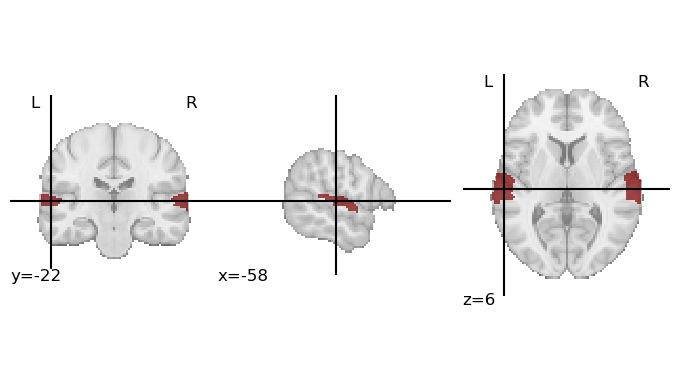

In [27]:
fine_ICP = "/project/3022057.01/resources/rois/ICPAtlas_v4_fine_208parcels.nii.gz"
course_ICP = "/project/3022057.01/resources/rois/ICPAtlas_v4_coarse_79parcels.nii.gz"
mask, atlas, region_labels = create_mask(fine_ICP)
print("Number  of Labels in Mask: ", len(region_labels))
view_labels(atlas)
# nplot.view_img(atlas)

### Parcellate Each Subject

In [14]:
allsubs = load(n,folder1,folder2)
alldata = parcellate_all(allsubs,mask,region_labels,save=True,verbose=True, location="icp_parcellated_subs")   

/project_cephfs/3022017.01/S1200/153934/MNINonLinear/Results/tfMRI_LANGUAGE_LR/tfMRI_LANGUAGE_LR.nii.gz
Number of atlas labels:  208
Number of parcellated labels:  208
Missing labels:  set()
/project/3022057.01/icp_parcellated_subs/153934/tfMRI_LANGUAGE_LR_parcellated.npy
/project_cephfs/3022017.01/S1200/153934/MNINonLinear/Results/tfMRI_WM_LR/tfMRI_WM_LR.nii.gz
Number of atlas labels:  208
Number of parcellated labels:  208
Missing labels:  set()
/project/3022057.01/icp_parcellated_subs/153934/tfMRI_WM_LR_parcellated.npy
/project_cephfs/3022017.01/S1200/164131/MNINonLinear/Results/tfMRI_LANGUAGE_LR/tfMRI_LANGUAGE_LR.nii.gz
Number of atlas labels:  208
Number of parcellated labels:  208
Missing labels:  set()
/project/3022057.01/icp_parcellated_subs/164131/tfMRI_LANGUAGE_LR_parcellated.npy
/project_cephfs/3022017.01/S1200/164131/MNINonLinear/Results/tfMRI_WM_LR/tfMRI_WM_LR.nii.gz
Number of atlas labels:  208
Number of parcellated labels:  208
Missing labels:  set()
/project/3022057.01/

### Load Already Parcellated Subjects and or Simulate Some Data

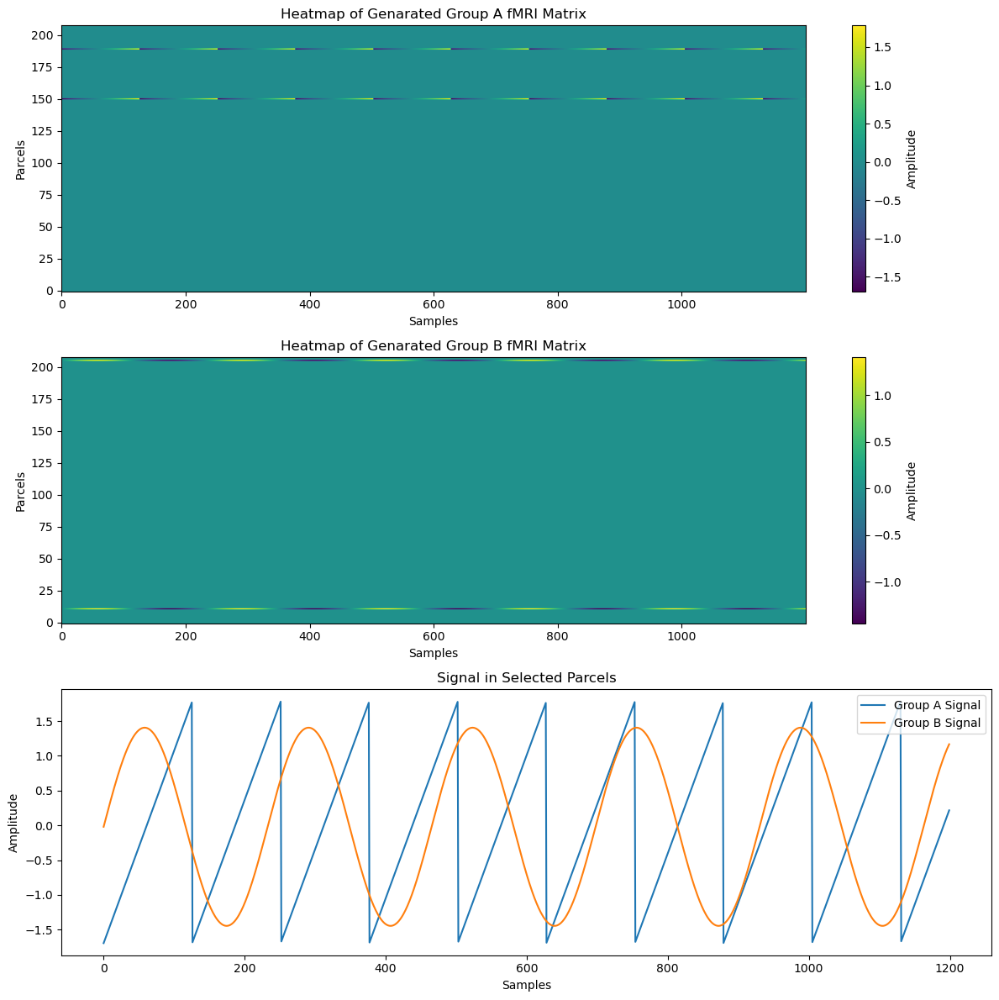

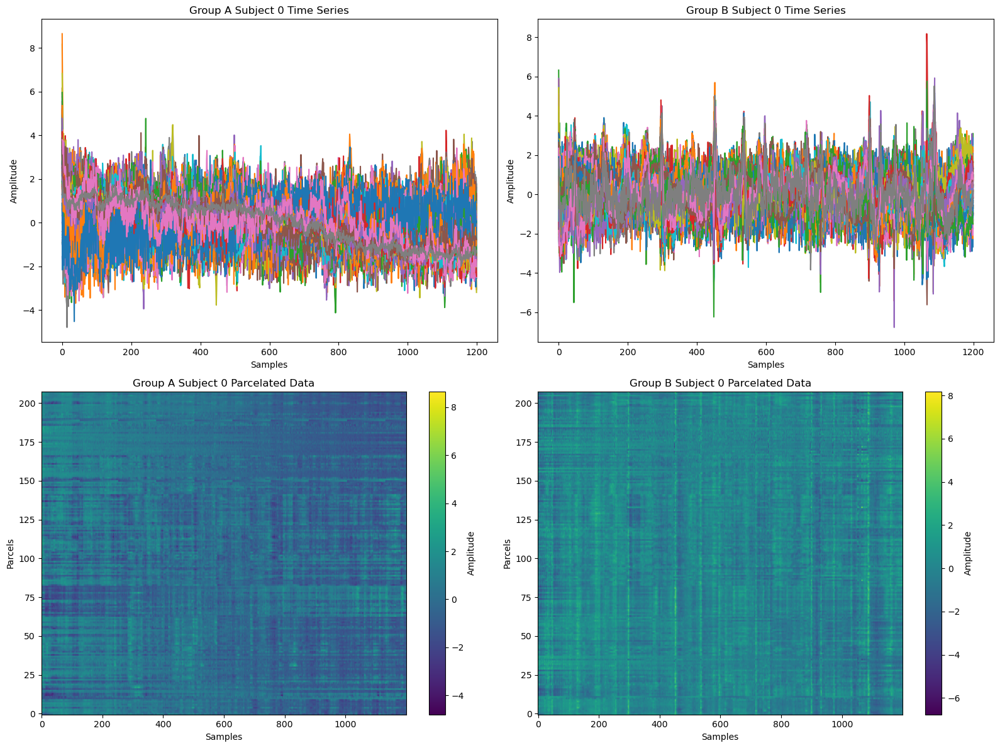

In [23]:
subjects_path = r'/project/3022057.01/icp_parcellated_subs'

groupA_data = []
groupB_data = []
groupA_type = "REST"
groupB_type = "MOTOR"
simulate = True

if simulate:
    allsubs_data = []
    for subdir, dirs, files in os.walk(subjects_path):
        for file in files:
            if groupA_type in file:
                sub_data = np.load(os.path.join(subdir,file))
                if sub_data.shape[0] == 1200:
                    allsubs_data.append(sub_data)
    allsubs_data = np.array(allsubs_data)
    groupA_data, groupB_data, groupA_parcels, groupB_parcels = simulate_data(allsubs_data, sig_freqA=.05,sig_freqB=.027, spatial_ratio=.01, sub_ratio=.5, original_level=.1, simulateA=True, simulateB=True)
else:
    for subdir, dirs, files in os.walk(subjects_path):
        for file in files:
            if groupA_type in file:
                sub_data = np.load(os.path.join(subdir,file))
                if sub_data.shape[0] == 1200:
                    groupA_data.append(sub_data)
            elif (groupB_type in file):
                groupB_data.append(np.load(os.path.join(subdir,file)))

groupA_data = np.array(groupA_data)
groupB_data = np.array(groupB_data)
# # all_subjects_data = np.array(all_subjects_data)
# last = groupA_data[0].shape
# for sub in groupA_data:
#     if last != sub.shape:
#         print(sub.shape)
#     else:
#         last = sub.shape
# last = groupB_data[0].shape
# for sub in groupB_data:
#     if last != sub.shape:
#         print(sub.shape)
#     else:
#         last = sub.shape
visualize_semi_simulated_subject(groupA_data, groupB_data)

### Standardize & Demean Each ROI Time Series for Each Subject and Demean Across Parcels for Each Timepoint

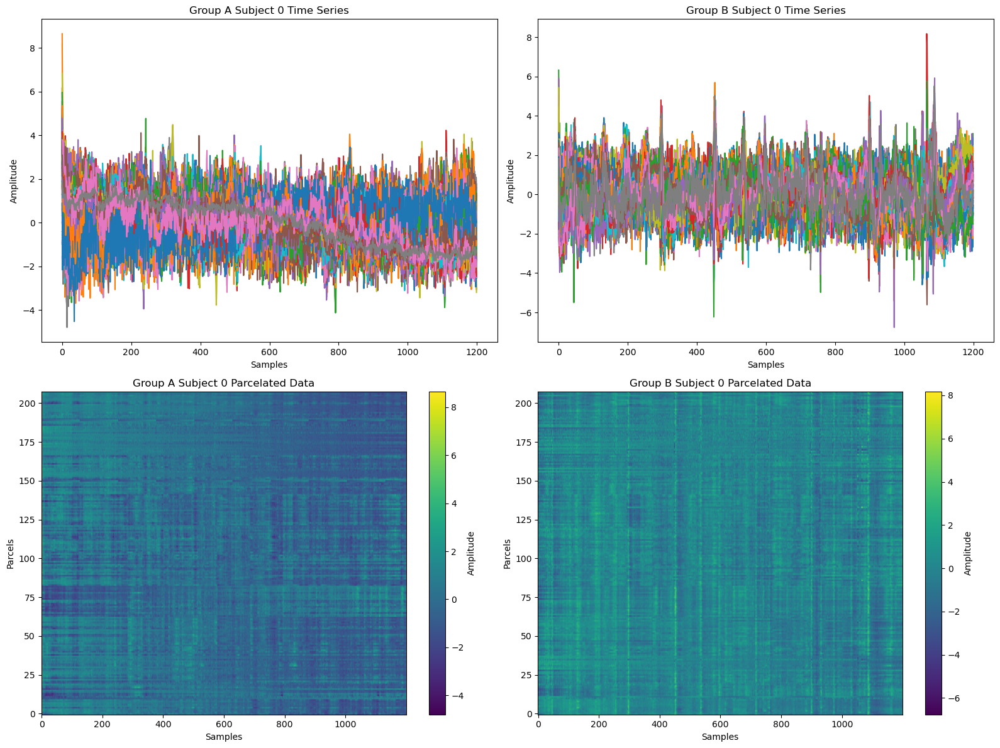

In [24]:
preprocessed_GroupA = standardize_demean(groupA_data)
preprocessed_GroupB = standardize_demean(groupB_data)
visualize_semi_simulated_subject(preprocessed_GroupA, preprocessed_GroupB)

### Create Covariance Matrices

In [25]:
# https://pyriemann.readthedocs.io/en/latest/auto_examples/signal/plot_covariance_estimation.html
cov_est = Covariances(estimator='lwf')

# Compute the covariance matrices for preprocessed_GroupA and preprocessed_GroupB
groupA_covs = cov_est.transform(np.transpose(preprocessed_GroupA, (0, 2, 1)))
groupB_covs = cov_est.transform(np.transpose(preprocessed_GroupB, (0, 2, 1)))

# groupa_init_mean = mean_covariance(covariance_GroupA, metric='riemann')
# groupb_init_mean = mean_covariance(covariance_GroupB, metric='riemann')

# groupA_covs = []
# for subject in preprocessed_GroupA:
#     lw = LedoitWolf()
#     lw.fit(subject,groupa_init_mean)
#     groupA_covs.append(lw.covariance_)
# groupA_covs = np.array(groupA_covs)

# groupB_covs = []
# for subject in preprocessed_GroupB:
#     lw = LedoitWolf()
#     lw.fit(subject, groupb_init_mean)
#     groupB_covs.append(lw.covariance_)
# groupB_covs = np.array(groupB_covs)

### Mean Swelling of Covariance Matrices

In [ ]:
mean_swelling(groupA_covs, groupB_covs)

KeyboardInterrupt: 

In [68]:
RiemA = mean_covariance(groupA_covs, metric='riemann')
RiemB = mean_covariance(groupB_covs, metric='riemann')
# eucA = mean_covariance(groupA_covs, metric='euclid')
# eucB = mean_covariance(groupB_covs, metric='euclid')
# Total = mean_covariance(np.concatenate((groupA_covs, groupB_covs)), metric='riemann')

In [26]:
print(np.linalg.norm(RiemA, ord='fro'))
print(np.linalg.norm(RiemA, ord='nuc'))
print(np.trace(RiemA))

7.986491250250681
47.25980285886398
47.25980285886398


In [30]:
print(np.linalg.norm(RiemA,ord=2),np.linalg.norm(RiemA, ord='nuc'))
print(np.linalg.norm(RiemB,ord=2),np.linalg.norm(RiemB, ord='nuc'))
print(np.linalg.norm(Total,ord=2),np.linalg.norm(Total, ord='nuc'))
print(np.linalg.norm(RiemA+RiemB,ord=2),np.linalg.norm(RiemA+RiemB, ord='nuc'))
print(np.linalg.norm(eucA,ord=2),np.linalg.norm(eucA, ord='nuc'))
print(np.linalg.norm(eucB,ord=2),np.linalg.norm(eucB, ord='nuc'))
print(np.linalg.norm(eucA + eucB,ord=2),np.linalg.norm(eucA + eucB, ord='nuc'))
print(np.linalg.norm(untangent_space(tangent_space(eucA,Total)-tangent_space(eucB,Total),Total),ord=2),np.linalg.norm(untangent_space(tangent_space(eucA,Total)-tangent_space(eucB,Total),Total), ord='nuc'))

6.875954528512809 47.25980285886398
12.580237123625531 63.389003102571195
9.08111617625329 53.9630134356105
19.42320444854574 110.64880596143516
58.83534218024539 207.82162037037045
62.31542411800339 207.23771126760508
120.94963433568884 415.0593316379756
10.427932544618889 58.50089873024345


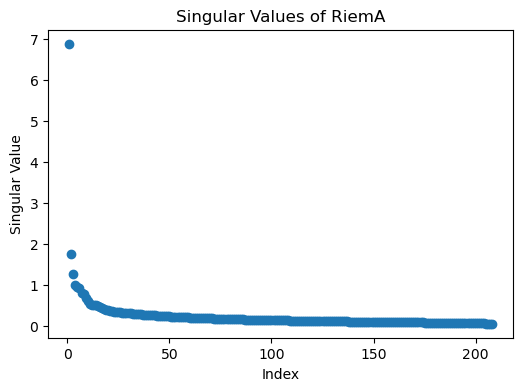

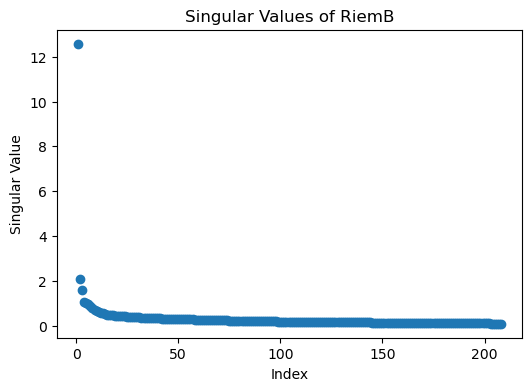

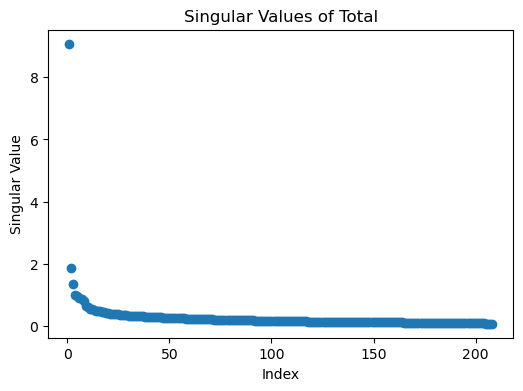

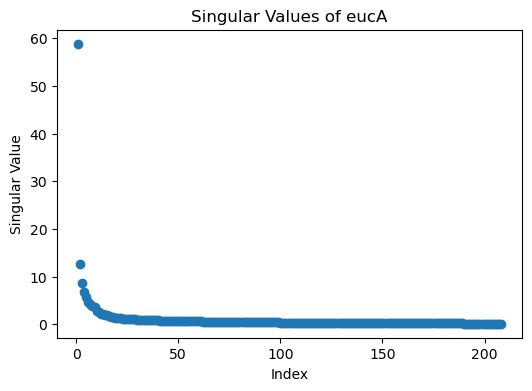

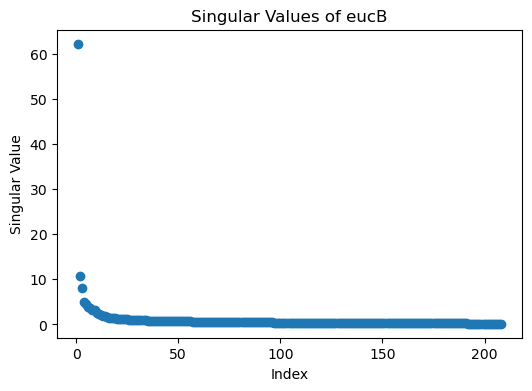

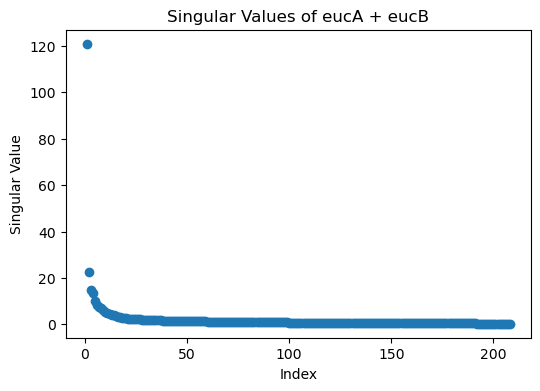

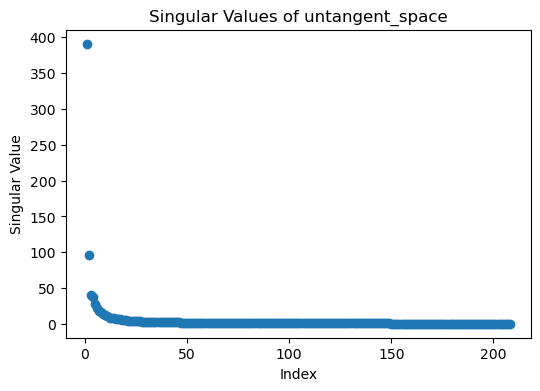

In [28]:
# List of matrices
matrices = [RiemA, RiemB, Total, eucA, eucB, eucA + eucB, untangent_space(tangent_space(eucA,Total)+tangent_space(eucB,Total),Total)]
names = ['RiemA', 'RiemB', 'Total', 'eucA', 'eucB', 'eucA + eucB', 'untangent_space']

for matrix, name in zip(matrices, names):
    # Perform SVD
    _, s, _ = np.linalg.svd(matrix)
    
    # Scatter plot of singular values
    plt.figure(figsize=(6, 4))
    plt.scatter(range(1, len(s) + 1), s)
    plt.title(f'Singular Values of {name}')
    plt.xlabel('Index')
    plt.ylabel('Singular Value')
    plt.show()

### Discriminant Methods

In [ ]:
from concurrent.futures import ProcessPoolExecutor


def single_simulation_run(n_samples, n_features, n_covs, filters_func):
    # Generate Gaussian matrices for class A and B with multiple samples for each
    new_classA = []
    new_classB = []
    eigenvalues_classes = []
    for _ in range(n_covs):
        dataA = np.random.normal(0, 1, (n_samples, n_features))
        dataB = np.random.normal(0, 1, (n_samples, n_features))
        new_classA.append(dataA)
        new_classB.append(dataB)
    
    new_classA = np.array(new_classA)
    new_classB = np.array(new_classB)

    # Compute covariance matrices using PyRiemann
    cov_estimator = Covariances(estimator='scm')  # Or 'empirical' or other suitable estimators
    covA = cov_estimator.transform(np.transpose(new_classA, (0, 2, 1)))
    covB = cov_estimator.transform(np.transpose(new_classB, (0, 2, 1)))
    # Compute the Riemannian mean of the covariances for each group
    riemann_mean_A = mean_covariance(covA, metric='riemann')
    riemann_mean_B = mean_covariance(covB, metric='riemann')
    # Eigenvalues of the Riemannian means
    
    eigenvalues_mean_A, _ = np.linalg.eig(riemann_mean_A)
    eigenvalues_mean_B, _ = np.linalg.eig(riemann_mean_B)
    eigs, _, perm_distances = filters_func(riemann_mean_A, riemann_mean_B, mean="riemann", average=False, threshold=0.0, visualize=False)
    
    # Compute eigenvalues for each individual covariance matrix
    for cov_matrix in covA:
        eig_vals, _ = np.linalg.eig(cov_matrix)
        eigenvalues_classes.extend(eig_vals)

    for cov_matrix in covB:
        eig_vals, _ = np.linalg.eig(cov_matrix)
        eigenvalues_classes.extend(eig_vals)
    return perm_distances, eigs, eigenvalues_mean_A, eigenvalues_mean_B, eigenvalues_classes

def perform_parallel_simulations(n_simulations, n_samples, n_features, n_covs, filters_func):
    perm_null_distances = []
    eigs_null = []
    eigenvalues_mean_A_null = []
    eigenvalues_mean_B_null = []  
    eigenvalues_classes_null = []  
    with ProcessPoolExecutor() as executor:
        futures = [executor.submit(single_simulation_run, n_samples, n_features, n_covs, filters_func) for _ in range(n_simulations)]
        for future in futures:
            perm_distances, eigs, eigenvalues_mean_A, eigenvalues_mean_B, eigenvalues_classes = future.result()
            perm_null_distances.extend(perm_distances)
            eigs_null.extend(eigs)
            eigenvalues_mean_A_null.extend(eigenvalues_mean_A)
            eigenvalues_mean_B_null.extend(eigenvalues_mean_B)
            eigenvalues_classes_null.extend(eigenvalues_classes)
    return perm_null_distances, eigs_null, eigenvalues_mean_A_null, eigenvalues_mean_B_null, eigenvalues_classes_null

def plot_histogram(data, title, color):
    plt.hist(data, bins=30, color=color, alpha=0.7, density=True)  # Using density=True for probability density
    plt.title(title)
    plt.xlabel('Eigenvalue')
    plt.ylabel('Density')

# Simulation parameters
n_samples = 1200  # Adjust based on your data's dimensions
n_features = 208  # Adjust based on your data's dimensions
n_simulations = 10
n_covs = 200  # Number of covariance samples per simulation

# Run the parallel simulations
riem_distances, csp_eigs, A_eigs, B_eigs, eigen_classes = perform_parallel_simulations(n_simulations, n_samples, n_features, n_covs, FKT)

# Plotting results
plt.figure(figsize=(10, 5))
plot_histogram(riem_distances, 'Histogram of Riem Distances', 'green')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 5))
plot_histogram(csp_eigs, 'Histogram of Eigenvalues from (A+B)^-1A', 'green')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 5))
plot_histogram(A_eigs, 'Histogram of A average Eigenvalues', 'green')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 5))
plot_histogram(B_eigs, 'Histogram of B Average Eigenvalues', 'green')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 5))
plot_histogram(eigen_classes, 'Histogram of Eigenvalues', 'green')
plt.tight_layout()
plt.show()

Process ForkProcess-14:
Process ForkProcess-11:
Process ForkProcess-13:
Process ForkProcess-38:
Process ForkProcess-20:
Process ForkProcess-37:
Process ForkProcess-30:
Process ForkProcess-23:
Process ForkProcess-24:
Process ForkProcess-45:
Process ForkProcess-12:
Process ForkProcess-44:
Process ForkProcess-16:
Process ForkProcess-46:
Process ForkProcess-15:
Process ForkProcess-39:
Process ForkProcess-18:
Process ForkProcess-22:
Process ForkProcess-31:
Process ForkProcess-41:
Process ForkProcess-28:
Process ForkProcess-27:
Process ForkProcess-35:
Process ForkProcess-43:
Process ForkProcess-40:
Process ForkProcess-32:
Process ForkProcess-21:
Process ForkProcess-17:
Process ForkProcess-47:
Process ForkProcess-34:
Process ForkProcess-42:
Process ForkProcess-36:
Process ForkProcess-33:
Process ForkProcess-29:
Process ForkProcess-19:
Process ForkProcess-48:
Process ForkProcess-25:
Process ForkProcess-26:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most re

Process ForkProcess-6:
Process ForkProcess-4:
Process ForkProcess-7:
Process ForkProcess-8:
Process ForkProcess-2:
Process ForkProcess-9:
Process ForkProcess-1:
Process ForkProcess-3:
Process ForkProcess-5:
Process ForkProcess-10:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/mrstats/zaisou/.conda/envs/IFA/lib/python3.11/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/home/mrstats/zaisou/.conda/envs/IFA/lib/python3.11/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/home/mrstats/zaisou/.conda/envs/IFA/lib/python3.11/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/home/mrstats/zaisou/.conda

KeyboardInterrupt: 

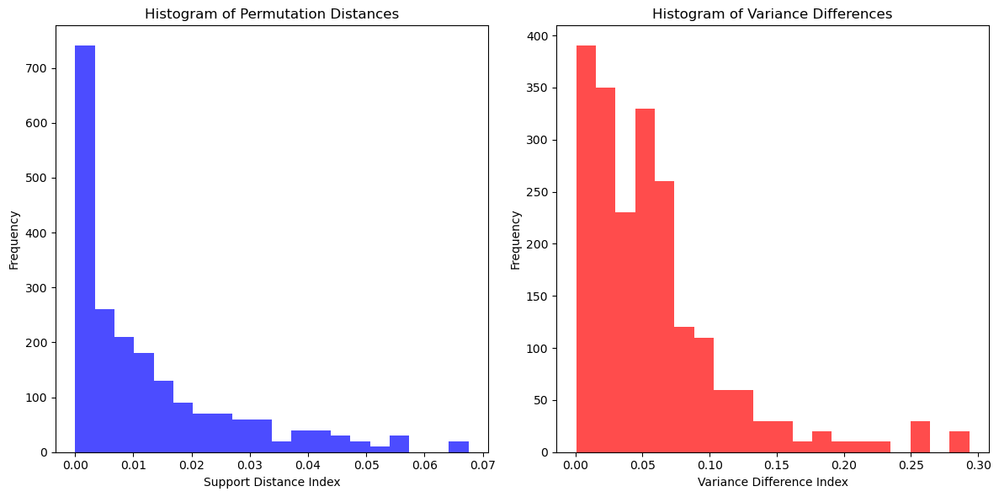

In [ ]:
from concurrent.futures import ProcessPoolExecutor
import numpy as np
import matplotlib.pyplot as plt

def single_run(data, n_classA, groupA, groupB, filters_func):
    # Shuffle the combined data locally
    np.random.shuffle(data)
    new_classA = data[:n_classA]
    new_classB = data[n_classA:]
    
    # Calculate filters using the permuted data
    _, filters, perm_distances = filters_func(new_classA, new_classB, mean="riemann", average=True, threshold=0.0, visualize=False)
    
    # Project original class data onto new filters and calculate variance differences
    alt_distances = np.abs(np.log(np.var(groupA@filters, axis=0)) - np.log(np.var(groupB@filters, axis=0)))
    return perm_distances, alt_distances

def simulate_FKT(n_simulations, combined_data, n_classA, groupA, groupB, filters_func):
    perm_support_distances = []
    alt_support_distances = []
    with ProcessPoolExecutor() as executor:
        futures = [executor.submit(single_run, combined_data.copy(), n_classA, groupA, groupB, filters_func) for _ in range(n_simulations)]
        for future in futures:
            perm_result, alt_result = future.result()
            perm_support_distances.extend(perm_result)
            alt_support_distances.extend(alt_result)
    return perm_support_distances, alt_support_distances

# Prepare the simulation data
combined_data = np.vstack([groupA_covs, groupB_covs])
n_classA = groupA_covs.shape[0]

# Group data ready for processing
groupA_data = preprocessed_GroupA.reshape(-1, preprocessed_GroupA.shape[2])
groupB_data = preprocessed_GroupB.reshape(-1, preprocessed_GroupB.shape[2])

# Run the simulation
n_simulations = 10
perm_distances, alt_distances = simulate_FKT(n_simulations, combined_data, n_classA, groupA_data, groupB_data, FKT)

# Visualize the results for permuted distances
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.hist(perm_distances, bins=20, color='blue', alpha=0.7)
plt.title('Histogram of Permutation Distances')
plt.xlabel('Support Distance Index')
plt.ylabel('Frequency')

# Visualize the results for alternate distances
plt.subplot(1, 2, 2)
plt.hist(alt_distances, bins=20, color='red', alpha=0.7)
plt.title('Histogram of Variance Differences')
plt.xlabel('Variance Difference Index')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [26]:
reshaped_preprocessed_subjects = np.array(np.vstack((preprocessed_GroupA.reshape(-1, preprocessed_GroupA.shape[2]), preprocessed_GroupB.reshape(-1, preprocessed_GroupB.shape[2]))))

In [36]:
from scipy.stats import multivariate_normal
import numpy as np

def vb_csp(X_k, M, N, L, a=10**-8, b=10**-8, tol=10**-8, max_iter=1000):
    """
    Variational Bayesian Common Spatial Patterns (VB-CSP) algorithm.
    
    Parameters:
    - X_k: list of matrices, where each matrix X_k[i] is the data matrix for condition k.
    - M: number of Estimates Components.
    - N: number of Channels.
    - L: Time Series Length.
    - a: hyperparameter for gamma distribution.
    - b: hyperparameter for gamma distribution.
    - tol: convergence tolerance.
    - max_iter: maximum number of iterations.
    
    Returns:
    - L_k: list of estimated L_k matrices for each condition.
    - Psi_k: list of estimated Psi_k matrices for each condition.
    - Xi: estimated Xi matrix.
    - q_Zk: list of variational distributions for Z_k.
    - q_A: variational distribution for A.
    """
    
    # Initialization
    A_hat = np.random.randn(N, M)
    L_k = [np.eye(M) for _ in range(len(X_k))]
    Psi_k = [np.eye(N) for _ in range(len(X_k))]
    Xi = np.diag([np.linalg.norm(A_hat[:, m], ord=2) for m in range(M)])
    Sigma_A = np.linalg.inv(Xi)    
    prev_A_hat = np.copy(A_hat)
    prev_free_energy = None

    for iteration in range(max_iter):        
        # Step 3: Update q(Z_k)
        qZk = []
        for k in range(len(X_k)):
            qZk_l = []
            for l in range(L):
                Sigma_Z_hat_l_k = np.linalg.inv(A_hat.T @ np.linalg.inv(Psi_k[k]) @ A_hat + np.sum([(Psi_k[k][n, n]**-1) * Sigma_A for n in range(N)], axis=0) + np.linalg.inv(L_k[k]))
                Z_hat_l_k = Sigma_Z_hat_l_k @ A_hat.T @ np.linalg.inv(Psi_k[k]) @ X_k[k][:, l]
                qZk_l.append((Z_hat_l_k, Sigma_Z_hat_l_k))
            qZk.append(qZk_l)
        
        # Step 4: Update q(A)
        qA = []
        for n in range(N):
            Sigma_A[n] = np.linalg.inv(Xi)
            for k in range(len(X_k)):
                for l in range(L):
                    Sigma_A[n] += (Psi_k[k][n, n]**-1) * (qZk[k][l][1] + qZk[k][l][0] @ qZk[k][l][0].T)
            Sigma_A[n] = np.linalg.inv(Sigma_A[n])

            A_hat[n, :] = np.zeros(M)
            for k in range(len(X_k)):
                for l in range(L):
                    A_hat[n, :] += (Psi_k[k][n, n]**-1) * X_k[k][n, l] * qZk[k][l][0].T @ Sigma_A[n]
            
            qA.append((A_hat[n, :], Sigma_A[n]))

        # Step 5: Update L_k
        for k in range(len(X_k)):
            sum_diag = np.zeros((M, M))
            for l in range(L):
                Z_hat_l_k = qZk[k][l][0]
                Sigma_Z_hat_l_k = qZk[k][l][1]
                sum_diag += (Sigma_Z_hat_l_k + Z_hat_l_k @ Z_hat_l_k.T) * np.eye(M)
            L_k[k] = (1 / (L + 2 * a)) * (sum_diag + 2 * b * np.eye(M))

        # Step 6: Update Psi_k
        for k in range(len(X_k)):
            sum_term = np.zeros((N, N))
            for l in range(L):
                Z_hat_l_k = qZk[k][l][0]
                Sigma_Z_hat_l_k = qZk[k][l][1]
                # TODO Did not take expectation used A_hat instead
                sum_term += (X_k[k][:, l] @ X_k[k][:, l].T - 2 * X_k[k][:, l] @ Z_hat_l_k.T @ A_hat.T + A_hat @ (Sigma_Z_hat_l_k + Z_hat_l_k @ Z_hat_l_k.T) @ A_hat.T)
            Psi_k[k] = (1 / (L + 2 * a)) * (sum_term + 2 * b * np.eye(N))

        # Step 7: Update Xi
        sum_diag = np.zeros(M)
        for n in range(N):
            sum_diag += np.diag(Sigma_A[n] + A_hat[n, :] @ A_hat[n, :].T)
        Xi = (1 / (N + 2 * a)) * (sum_diag + 2 * b)

        # Check for convergence based on change in A_hat
        delta_A_hat = np.linalg.norm(A_hat - prev_A_hat, ord='fro')
        prev_A_hat = np.copy(A_hat)
        
        # Optionally, compute and check the change in variational free energy if needed
        # free_energy = compute_free_energy(X_k, A_hat, Psi_k, L_k, Xi, qZk, qA)
        # will have to write free energy function but pretty straight forward
        # if prev_free_energy is not None and abs(free_energy - prev_free_energy) < tol:
        #     break
        # prev_free_energy = free_energy
        
        if delta_A_hat < tol:
            break
        
    return L_k, Psi_k, Xi, qZk, qA

reshapedA = np.reshape(preprocessed_GroupA,(-1,preprocessed_GroupA.shape[-1])).T
reshapedB = np.reshape(preprocessed_GroupB,(-1,preprocessed_GroupB.shape[-1])).T
X_k = [reshapedA,reshapedB] 
M = reshapedA.shape[0]  # Number of Estimated Components
N = reshapedA.shape[0]  # Number of Channels
L = reshapedA.shape[1]  # Time Series Length
print(M,N,L)
L_k, Psi_k, Xi, qZk, qA = vb_csp(X_k, M, N, L)

208 208 118800


LinAlgError: 1-dimensional array given. Array must be at least two-dimensional

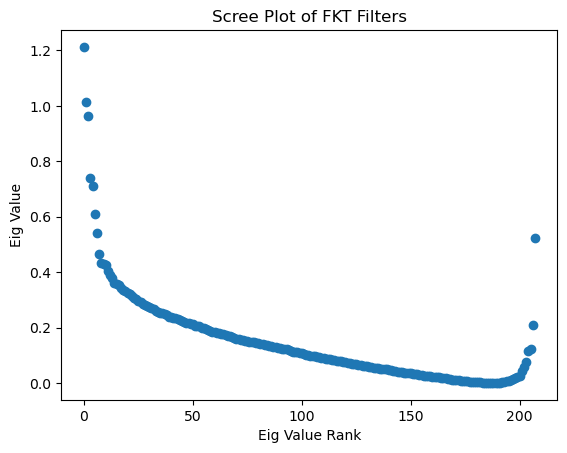

cuda


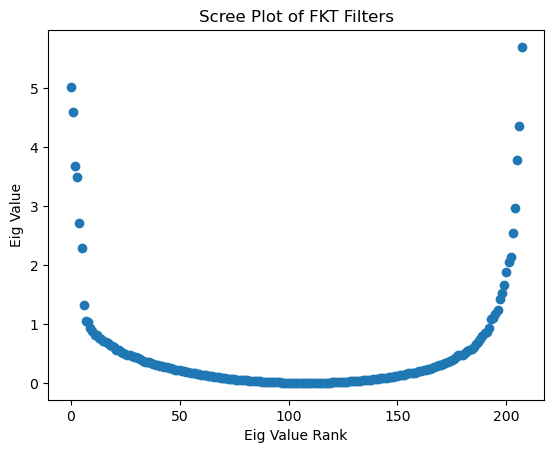

In [37]:
# Regularized CSP
fkt_eigs, fkt_filters, max_discrim = FKT(groupA_covs, groupB_covs, mean="riemann", average=True, threshold=.999, visualize=True, gamma=0.0)
# fkt_eigE, fkt_filterE, max_discrimE = FKT(groupA_covs, groupB_covs, mean="riemann", average=True, threshold=.5, visualize=True, gamma=0.0)

# _, _, _, _ = FKT(groupA_covs, groupB_covs, mean="euclid", average=True, threshold=.0, visualize=True, gamma=0.0, d=0)


# Tangent CSP
    # Tangent space spatial filters for interpretable and efficient Riemannian classification (https://arxiv.org/pdf/1909.10567.pdf)
# TSSF_filters, TSSF_weights = TSSF(groupA_covs, groupB_covs, preprocessed_GroupA, preprocessed_GroupB, k=2, visualize=False)
    
    # SVM on Tangent Space Vectorized Covariances
# eigvecs_ASVM, filtersASVM, filtersBSVM, Frechet_MeanSVM, discrimASVM, discrimBSVM = tangent_classifier(groupA_covs, groupB_covs)
# fkt_eigSVM, fkt_filtersSVM, maxdiscrimSVM = FKT(filtersASVM[0,:,:], Frechet_MeanSVM, mean="riemann", average=False, threshold=.5, visualize=True, gamma=0.0)
    
# CSP on Tangent Space Vectorized Covariances 
# eigs_A, eigvecs_A, filtersA, filtersB, Frechet_Mean, discrimA, discrimB = tangent_CSP(groupA_covs, groupB_covs)
# fkt_eigsT, fkt_filtersT, maxdiscrimT = FKT(filtersA[0,:,:], Frechet_Mean, mean="riemann", average=False, threshold=.5, visualize=True, gamma=0.0)
filters_tangent,max_discrim_tangent = tangent_CSP(groupA_covs,groupB_covs)
    # Test case when there is no discriminant information in Ax
    # LDA on Tangent Space Vectorized Covariances



# Graph Based Class Structure Preserving Methods
    # Dimensionality Reduction on SPD Manifolds: The Emergence of Geometry-Aware Methods (https://ieeexplore-ieee-org.proxy.lib.umich.edu/abstract/document/7822908)
    # LPP+FLDA
    # Bilinear Methods
    # Graph Regularized

    # Set the parameters for dimensionality reduction
# m = 208  # Target dimensionality
# nw = 10  # Number of nearest within-class neighbors
# nb = 10  # Number of nearest between-class neighbors
#     # metric = 'airm'  # Distance metric (can be 'airm', 'stein', or 'jeffrey')
#     # Perform supervised dimensionality reduction
# W = supervised_dim_reduction_optimized(groupA_covs, groupB_covs, RiemA, RiemB, m, nw, nb, max_iter=100, tol=1e-3)
# Other Methods
    # Bilinear Discriminant Analysis

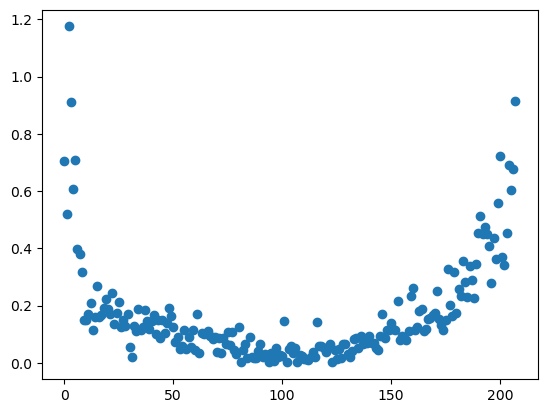

In [38]:
plt.scatter(range(0,208),np.abs(np.log(np.var(groupA_data@filters_tangent, axis=0)) - np.log(np.var(groupB_data@filters_tangent, axis=0))))
plt.show()

In [39]:
import numpy as np

def test_significance(null_distribution, test_statistics, alpha=0.05):
    """
    Calculate p-values for test statistics against a null distribution and apply Bonferroni correction.

    Parameters:
    - null_distribution (array-like): The distribution of values under the null hypothesis.
    - test_statistics (array-like): The statistics to test against the null distribution.
    - alpha (float): The significance level for the tests (default is 0.05).

    Returns:
    - p_values (np.array): The p-values for each test statistic.
    - significant_tests (np.array): Boolean array indicating which tests are significant.
    """
    # Calculate p-values
    p_values = np.array([np.mean(null_distribution >= ts) for ts in test_statistics])

    # Apply Bonferroni correction
    number_of_tests = len(test_statistics)
    bonferroni_alpha = alpha / number_of_tests

    # Determine which tests are significant
    significant_tests = p_values < bonferroni_alpha

    return p_values, significant_tests

# Example usage:
np.random.seed(0)
# Test for significance
p_values_riem, significant_tests_riem = test_significance(perm_distances, max_discrim_tangent)
# print("P-values:", p_values_riem)
print("Significant tests:", np.where(significant_tests_riem)[0])

# Test for significance
p_values, significant_tests = test_significance(alt_distances, np.abs(np.log(np.var(groupA_data@filters_tangent, axis=0)) - np.log(np.var(groupB_data@filters_tangent, axis=0))))
# print("P-values:", p_values_riem)
print("Significant tests:", np.where(significant_tests)[0])

Significant tests: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156
 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174
 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192
 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207]
Significant tests: [  0   1   2   3   4   5   6   7   8 176 179 183 186 189 190 191 192 193
 194 195 197 198 199 200 201 202 203 204 205 206 207]


In [40]:
import numpy as np
from scipy.stats import gamma

def estimate_gamma_probability(data_points, test_point, tail='right'):
    """
    Estimate the probability that a test point came from the same Gamma distribution as the given data points.
    
    Parameters:
    - data_points (array-like): The distribution of values from which to model.
    - test_point (float): The test point to evaluate.
    - tail (str): 'right' for right-tailed (greater than), 'left' for left-tailed (less than).

    Returns:
    - p_value (float): The p-value for the test point under the assumed Gamma distribution.
    """
    # Fit a Gamma distribution to the data
    # Here, we fix the location parameter to zero to focus on fitting only the shape and scale
    shape, loc, scale = gamma.fit(data_points, floc=0)

    if tail == 'right':
        # Calculate the p-value for the test point for a right-tailed test
        p_value = 1 - gamma.cdf(test_point, a=shape, loc=loc, scale=scale)
    elif tail == 'left':
        # Calculate the p-value for the test point for a left-tailed test
        p_value = gamma.cdf(test_point, a=shape, loc=loc, scale=scale)
    else:
        raise ValueError("Tail must be 'right' or 'left'")
    
    return p_value

p_value = estimate_gamma_probability(perm_distances, max_discrim_tangent, tail='right')

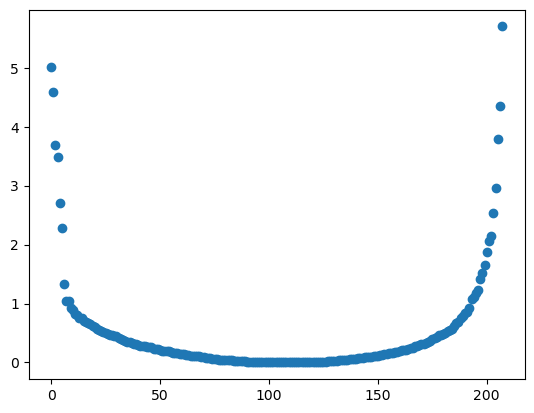

In [41]:
plt.scatter(range(0,208),(1-p_value)*max_discrim_tangent)
plt.show()

In [42]:
adjusted_args = np.argsort((1.0-p_value)*max_discrim_tangent)[::-1]
adjusted_vals = np.sort((1.0-p_value)*max_discrim_tangent)[::-1]

In [43]:
def calculate_p_D_given_k(eigenvalues, N, k):
    """
    Calculate p(D|k) for a given k using the provided formula without directly taking d or v.
    
    Parameters:
    - eigenvalues: Array of eigenvalues of the data covariance matrix.
    - N: Number of data points.
    - k: Number of principal components.
    
    Returns:
    - p_D_given_k: The value of p(D|k).
    """
    d = len(eigenvalues)  # Dimensionality of the data inferred from eigenvalues
    
    # Compute the sum of the logarithms of the transformed eigenvalues from k+1 to d
    log_prod_lambda_transformed = np.sum(np.log(eigenvalues[:k]))
    
    # Compute noise variance v as the average of the transformed eigenvalues from k+1 to d
    v_transformed = np.sum(eigenvalues[k:]) / (d - k)
    
    # Compute the term involving noise variance v
    log_v_term = -(N * (d - k) / 2) * np.log(v_transformed)
    
    # Compute the term involving N
    m = k * d - (k * (k + 1)) / 2  # Dimension of the manifold
    log_N_term = -((m + k) / 2) * np.log(N)
    
    # Compute the overall log of p(D|k)
    log_p_D_given_k = (-N / 2) * log_prod_lambda_transformed + log_v_term + log_N_term
    
    return log_p_D_given_k

In [44]:
score_estimation = []
for i in range(0,208):
    score_estimation.append(calculate_p_D_given_k(adjusted_vals,1200,i))


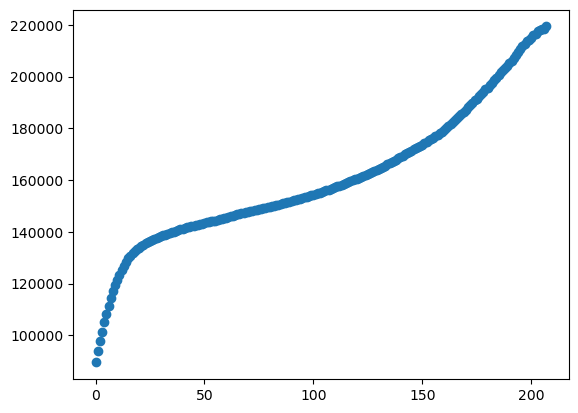

In [47]:
plt.scatter(range(0,208),score_estimation)
plt.show()

In [110]:
selected_filters = adjusted_args[:np.argmax(score_estimation[0:150])]

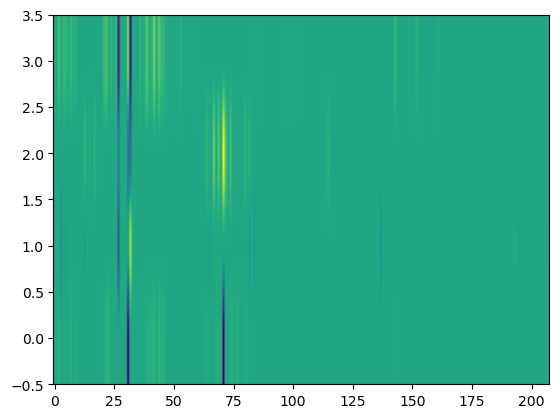

In [32]:
plt.imshow(FKT_proj(reshaped_preprocessed_subjects,fkt_filters[:,[0,1,-2,-1]],method="lassolinreg",alpha=.2), aspect='auto', cmap='viridis', origin='lower')
plt.show()

In [49]:

# Assuming the following arrays are already defined from your FKT function output
# fkt_eigs, fkt_filters, max_discrim = FKT(groupA_covs, groupB_covs, mean="riemann", average=True, threshold=.7, visualize=True, gamma=0.0)

# Sample data for max_discrim and distances for demonstration
# max_discrim = np.array([0.5, 0.8, 1.2, 0.9, 0.4])
# distances = np.array([0.7, 0.6, 0.85, 0.88, 0.65])

# Find the maximum value in distances
max_distance = np.max(alt_distances)

# Find indices where max_discrim values are greater than all values in distances
indices_greater = np.where((1-p_value)*max_discrim_tangent > max_distance)[0]

# Print out the results
print("Indices in max_discrim where values are greater than all values in distances:", indices_greater)

Indices in max_discrim where values are greater than all values in distances: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40 169 170 171 172 173 174 175 176 177 178 179 180 181
 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199
 200 201 202 203 204 205 206 207]


##### Filter Selection and Thresholding

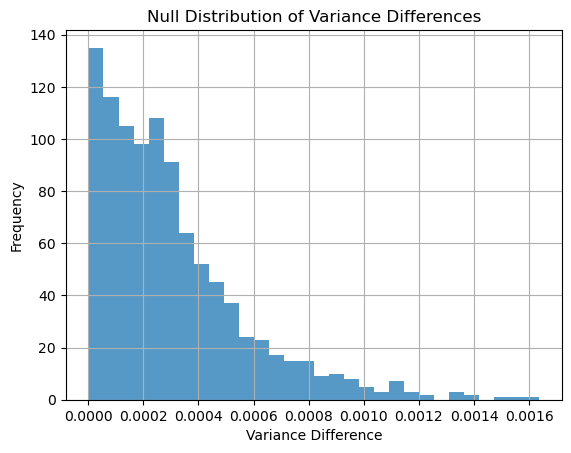

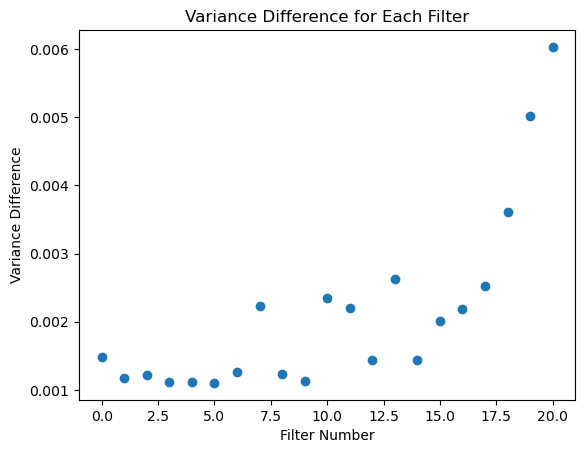

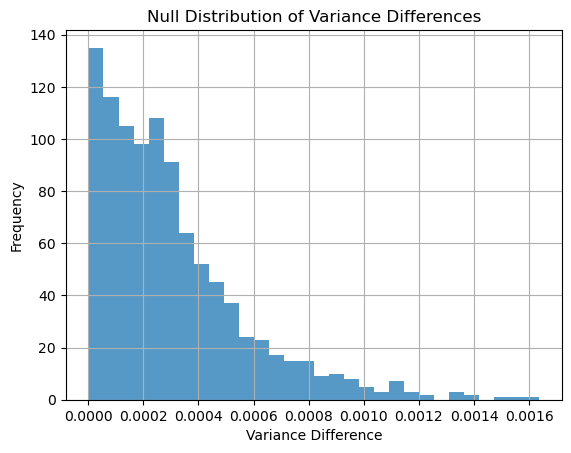

KeyboardInterrupt: 

In [80]:
def calculate_p_values_and_plot(groupA, groupB, filters):
    reshapedB = np.reshape(groupB,(-1,groupB.shape[-1]))
    reshapedA = np.reshape(groupA,(-1,groupA.shape[-1]))
    # n_channels = preprocessed_GroupA.shape[-1]

    # # Initialize the null distribution
    # n_permutations = 1000
    # null_distribution = np.zeros(n_permutations)

    # # Generate the null distribution
    # np.random.seed(0)
    # for i in range(n_permutations):
    #     # Generate a random filter
    #     random_filter = np.random.normal(size=(n_channels,1))
        
    #     # Normalize the filter
    #     random_filter /= np.linalg.norm(random_filter)
        
    #     # Compute the variance difference for the random filter
    #     null_distribution[i] = np.abs(np.var(reshapedA@np.linalg.pinv(random_filter.T)@random_filter.T,axis=None) - np.var(reshapedB@np.linalg.pinv(random_filter.T)@random_filter.T,axis=None))
    #     if i%100 == 0:
    #         print(i)
    null_distribution = np.load('null_distribution.npy')
    plt.hist(null_distribution, bins=30, alpha=0.75)
    plt.xlabel('Variance Difference')
    plt.ylabel('Frequency')
    plt.title('Null Distribution of Variance Differences')
    plt.grid(True)
    plt.show()
    
    group_diff = []
    for i in range(filters.shape[1]):
        proj = np.linalg.pinv(filters[:,i:i+1].T)@filters[:,i:i+1].T
        group_diff.append(np.abs(np.var(reshapedB@proj,axis=None) - np.var(reshapedA@proj,axis=None)))
    group_diff = np.array(group_diff)

    plt.scatter(range(0,filters.shape[1]),group_diff)
    plt.title('Variance Difference for Each Filter')
    plt.xlabel('Filter Number')
    plt.ylabel('Variance Difference')
    plt.show()

    # Calculate p-values
    p_values = [np.sum(null_distribution >= diff) / len(null_distribution) for diff in group_diff]
    return np.array(p_values)

# Call the function for groupA_fktfilters
a_pvalues = calculate_p_values_and_plot(preprocessed_GroupA, preprocessed_GroupB, groupA_fktfilters)

# Call the function for groupB_fktfilters
b_pvalues = calculate_p_values_and_plot(preprocessed_GroupA, preprocessed_GroupB, groupB_fktfilters)

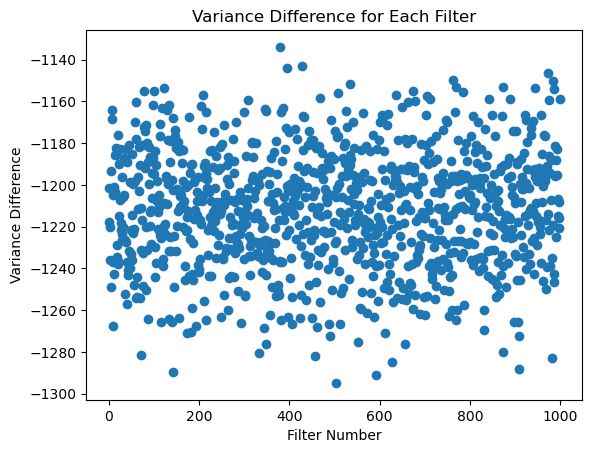

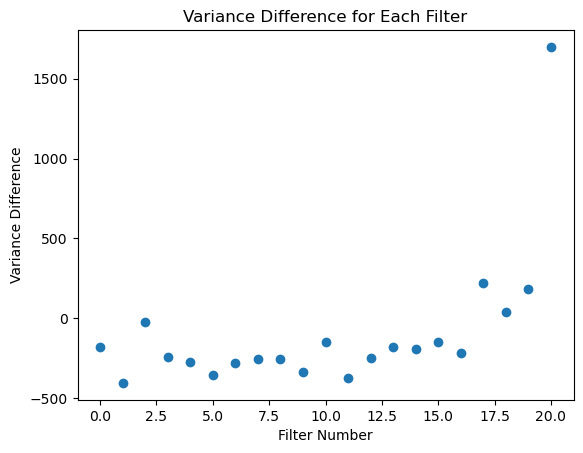

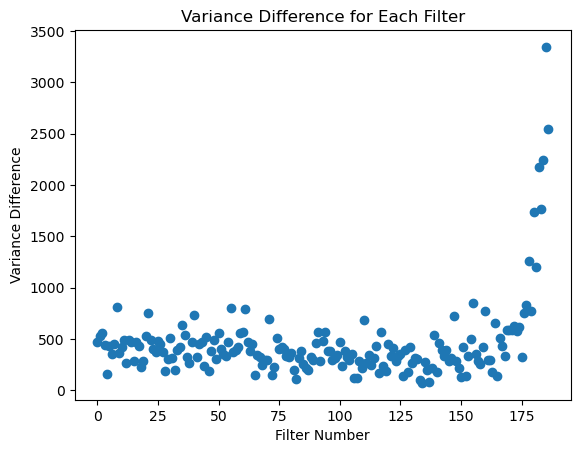

In [118]:
def calculate_var(group1, group2, filters):    
    group_diff = []
    for i in range(filters.shape[1]):
        normalized_filter = filters[:,i:i+1] / np.linalg.norm(filters[:,i:i+1])

        projections1 = []
        for j in range(group1.shape[0]):
            sub = group1[j,:,:]
            projections1.append(np.squeeze(((sub@normalized_filter).T@sub)))
        projections1 = np.array(projections1)
        
        projections2 = []
        for j in range(group2.shape[0]):
            sub = group2[j,:,:]
            projections2.append(np.squeeze(((sub@normalized_filter).T@sub)))
        projections2 = np.array(projections2)
        
        # group_diff.append(np.sum(np.triu(cosine_similarity(projections1, projections1), k=1))- np.sum(np.triu(cosine_similarity(projections1, projections2), k=1)))
        # group_diff.append(np.sum(np.triu(np.abs(cosine_similarity(projections1, projections1)), k=1))- np.sum(np.triu(np.abs(cosine_similarity(projections1, projections2)), k=1)))
        # group_diff.append(np.mean(np.triu(projections1@projections1.T)) - np.mean(np.triu(projections1@projections2.T)))
    group_diff = np.array(group_diff)

    plt.scatter(range(0,filters.shape[1]),group_diff)
    plt.title('Variance Difference for Each Filter')
    plt.xlabel('Filter Number')
    plt.ylabel('Variance Difference')
    plt.show()
    return group_diff

# create null distribution
permutations = 1000
random_filter = np.random.random_sample(size=(groupA_fktfilters.shape[0],permutations))
diffNull = calculate_var(preprocessed_GroupA, preprocessed_GroupB, random_filter)

# Call the function for groupA_fktfilters
diffA = calculate_var(preprocessed_GroupA, preprocessed_GroupB, groupA_fktfilters)

# Call the function for groupB_fktfilters
diffB = calculate_var(preprocessed_GroupB, preprocessed_GroupA, groupB_fktfilters)

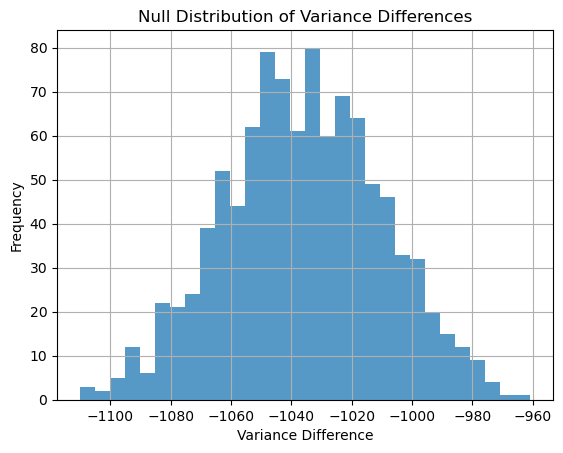

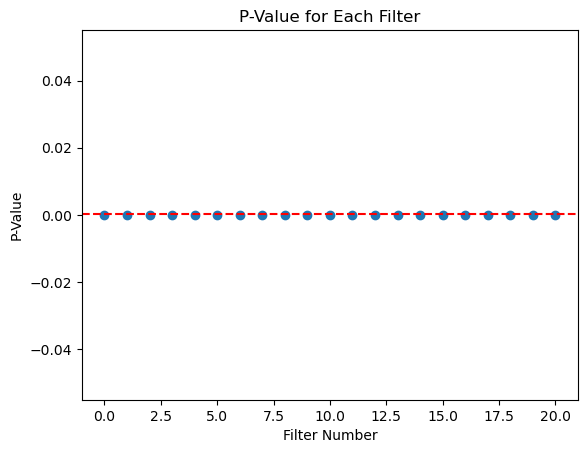

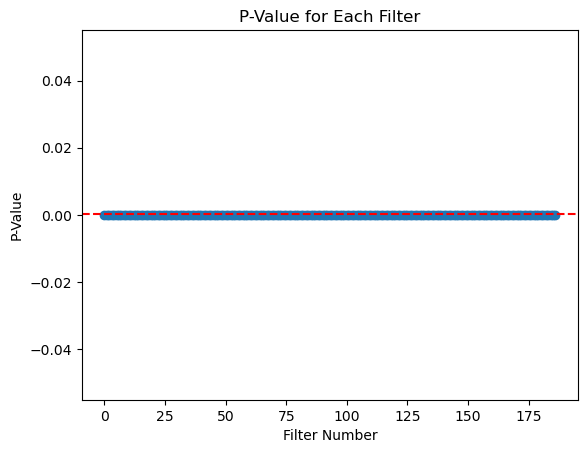

[ 2 12 13 16 17 18 19 20]
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186]


In [115]:
plt.hist(diffNull, bins=30, alpha=0.75)
plt.xlabel('Variance Difference')
plt.ylabel('Frequency')
plt.title('Null Distribution of Variance Differences')
plt.grid(True)
plt.show()

threshold2 = 0.05/(diffA.shape[0]+diffB.shape[0])
DiffAp_values = [np.sum(diffNull >= diff) / len(diffNull) for diff in diffA]
DiffAp_values = np.array(DiffAp_values)
DiffBp_values = [np.sum(diffNull >= diff) / len(diffNull) for diff in diffB]
DiffBp_values = np.array(DiffBp_values)
plt.scatter(range(0,DiffAp_values.shape[0]),DiffAp_values)
plt.axhline(y=threshold2, color='r', linestyle='--')  # Plot horizontal line for threshold
plt.title('P-Value for Each Filter')
plt.xlabel('Filter Number')
plt.ylabel('P-Value')
plt.show()

plt.scatter(range(0,DiffBp_values.shape[0]),DiffBp_values)
plt.axhline(y=threshold2, color='r', linestyle='--')  # Plot horizontal line for threshold
plt.title('P-Value for Each Filter')
plt.xlabel('Filter Number')
plt.ylabel('P-Value')
plt.show()

selected_a_fkt_filters = np.where(diffA > 0)[0]
selected_b_fkt_filters = np.where(diffB > 0)[0]
print(selected_a_fkt_filters)
print(selected_b_fkt_filters)

#### Visualization

(80, 208)
(80, 208)
(80, 208)


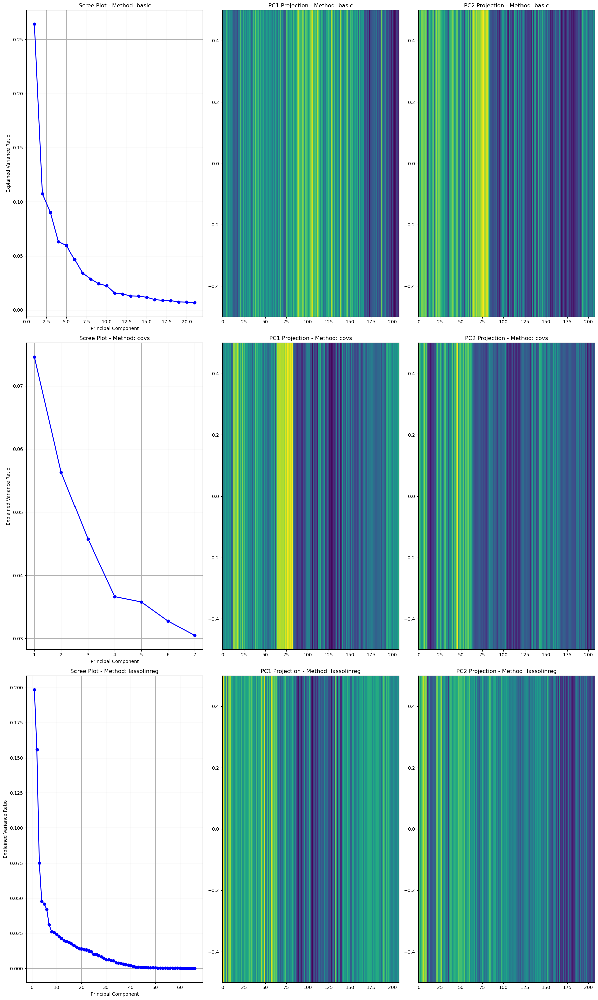

In [54]:
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Assuming you have the following variables:
# reshaped_preprocessed_subjects: 2D array of shape (n_samples, n_features)
# fkt_filters: 2D array of shape (n_features, n_components)
# indices_greater: Indices of selected filters for the method application

# Define the methods to use in FKT_proj
# methods = ["basic", "covs", "linreg", "grouplassolinreg", "lassolinreg", "elasticlinreg"]
methods = ["basic", "covs", "lassolinreg"]

# Create a figure with subplots for each method
fig, axes = plt.subplots(len(methods), 3, figsize=(18, 30))  # 3 columns for scree plot, PC1, and PC2

# Iterate over each method
for i, method in enumerate(methods):
    # Compute the FKT_proj output for the current method
    proj = FKT_proj(reshaped_preprocessed_subjects, fkt_filters[:, indices_greater], method=method, alpha=.25, l1_ratio=0.9)
    print(proj.shape)
    # Perform PCA on the FKT_proj output
    pca = PCA(n_components='mle')  # automatic model selection
    principal_components = pca.fit_transform(proj.T)
    # Get the explained variance ratios
    explained_variance_ratio = pca.explained_variance_ratio_

    # Scree plot for the current method
    axes[i, 0].plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, 'bo-', linewidth=2)
    axes[i, 0].set_xlabel('Principal Component')
    axes[i, 0].set_ylabel('Explained Variance Ratio')
    axes[i, 0].set_title(f'Scree Plot - Method: {method}')
    axes[i, 0].grid(True)
    
    # Plot the projection of the data onto the first principal component
    axes[i, 1].imshow(principal_components[:, 0].reshape(-1, 1).T, aspect='auto', cmap='viridis', origin='lower')
    axes[i, 1].set_title(f'PC1 Projection - Method: {method}')
    
    # Plot the projection of the data onto the second principal component
    axes[i, 2].imshow(principal_components[:, 1].reshape(-1, 1).T, aspect='auto', cmap='viridis', origin='lower')
    axes[i, 2].set_title(f'PC2 Projection - Method: {method}')

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()

In [ ]:
model_score_estimation = []
for i in range(0,208):
    model_score_estimation.append(calculate_p_D_given_k(adjusted_vals,208,i))

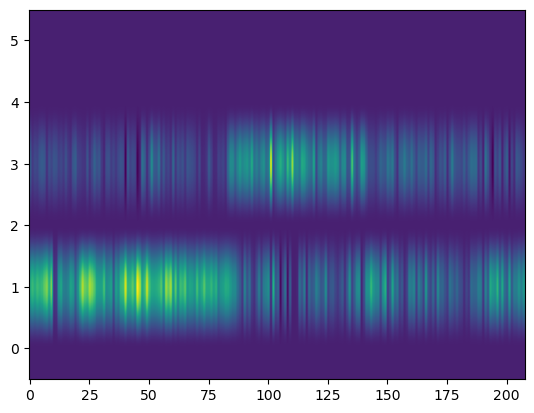

In [125]:
plt.imshow(FKT_proj(reshaped_preprocessed_subjects,FKT_proj(reshaped_preprocessed_subjects,fkt_filters[:,resorted],method="lassolinreg",alpha=.4).T,method="grouplassolinreg",alpha=.2), aspect='auto', cmap='viridis', origin='lower')
plt.show()

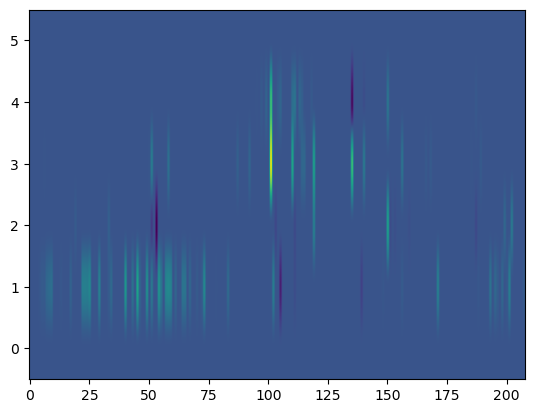

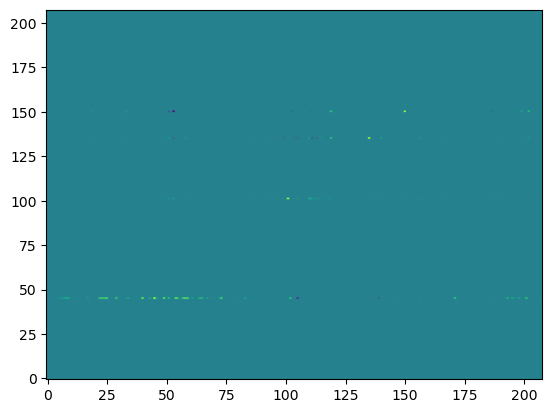

In [128]:
S = FKT_proj(reshaped_preprocessed_subjects,fkt_filters[:,resorted],method="lassolinreg",alpha=.3)
plt.imshow(S, aspect='auto', cmap='viridis', origin='lower')
plt.show()
reg = MultiTaskLasso(alpha=.0002)  # Using 5-fold cross-validation
reg.fit(S, S)
proj = reg.coef_.T
plt.imshow(proj, aspect='auto', cmap='viridis', origin='lower')
plt.show()

In [245]:
plt.imshow(FKT_proj(reshaped_preprocessed_subjects,fkt_filters[:,resorted],method="lassolinreg",alpha=.0), aspect='auto', cmap='viridis', origin='lower')
plt.show()

/home/mrstats/zaisou/.conda/envs/IFA/lib/python3.11/site-packages/sklearn/base.py:1474: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  return fit_method(estimator, *args, **kwargs)
/home/mrstats/zaisou/.conda/envs/IFA/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
/home/mrstats/zaisou/.conda/envs/IFA/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.004e+05, tolerance: 2.374e+01 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn

KeyboardInterrupt: 

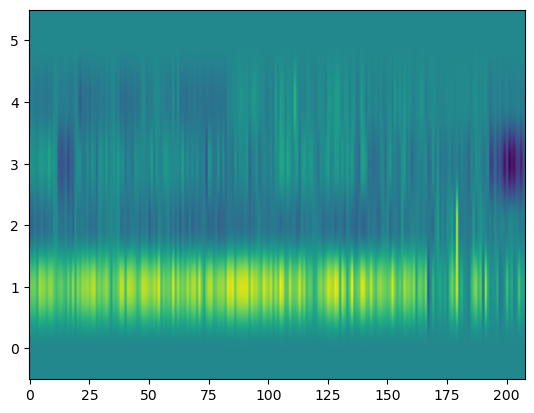

In [244]:
plt.imshow(FKT_proj(reshaped_preprocessed_subjects,fkt_filters[:,resorted],method="grouplassolinreg",alpha=1.9), aspect='auto', cmap='viridis', origin='lower')
plt.show()

In [64]:
from sklearn.decomposition import SparsePCA, TruncatedSVD
import numpy as np

# Assuming X is your data matrix
# Step 1: Sparse PCA
n_components = 10  # Number of sparse components to compute
transformer = SparsePCA(n_components=n_components, alpha=0.1, ridge_alpha=0.01, random_state=42)
X_transformed = transformer.fit_transform(FKT_proj(reshaped_preprocessed_subjects,fkt_filters[:,resorted],method="linreg").T)

# Step 2: Apply Truncated SVD to the sparse matrix to enforce low-rank
svd = TruncatedSVD(n_components=5, n_iter=7, random_state=42)
X_low_rank_sparse = svd.fit_transform(X_transformed)

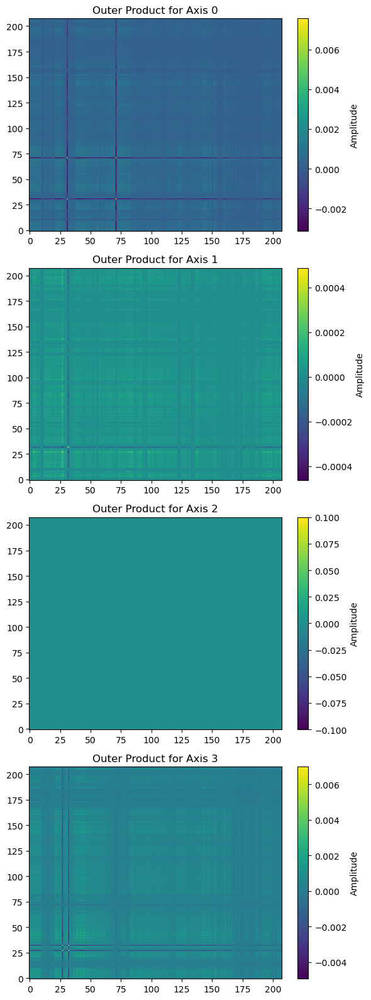

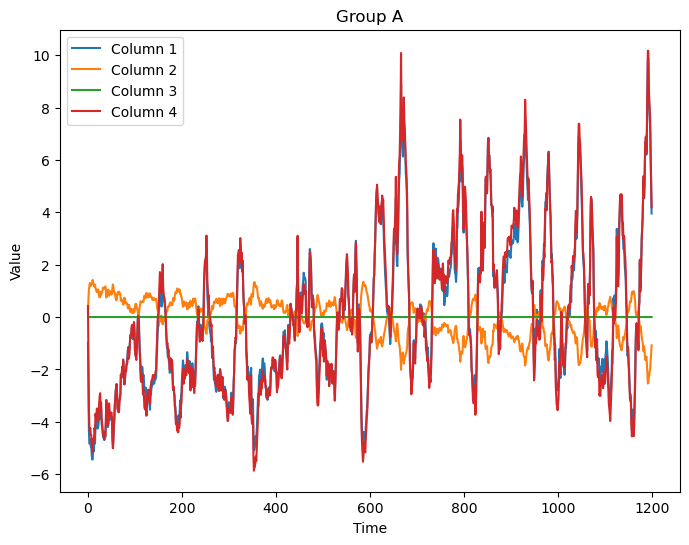

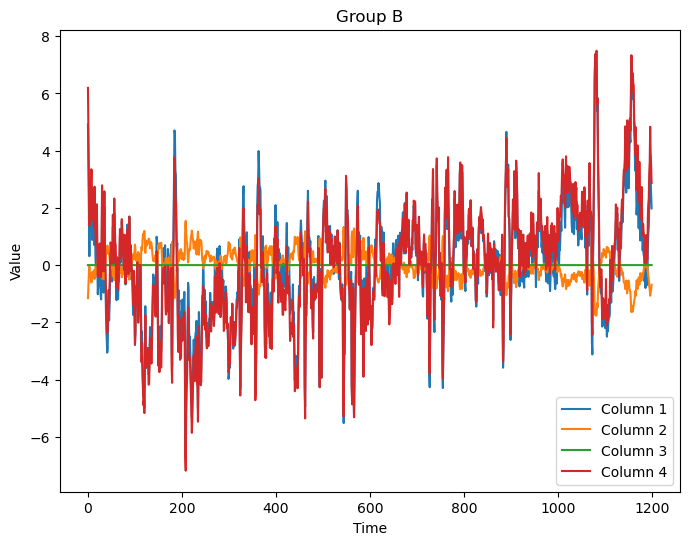

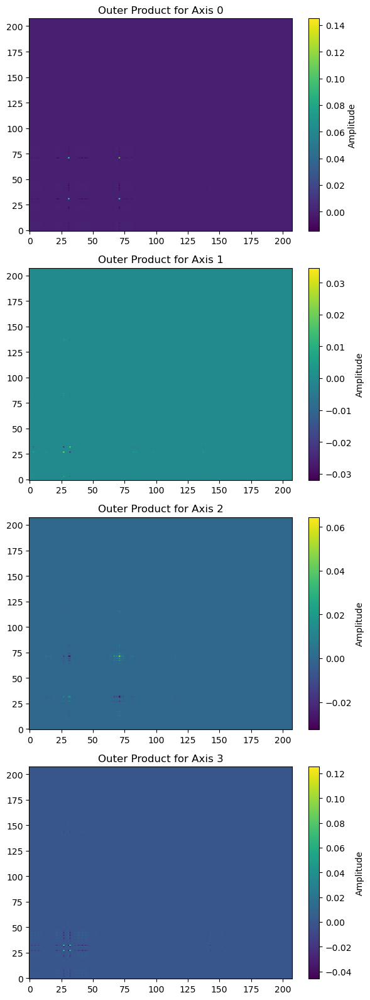

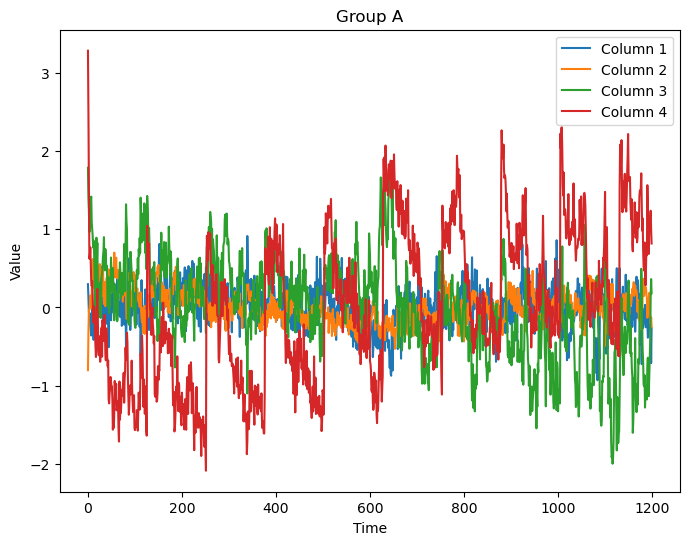

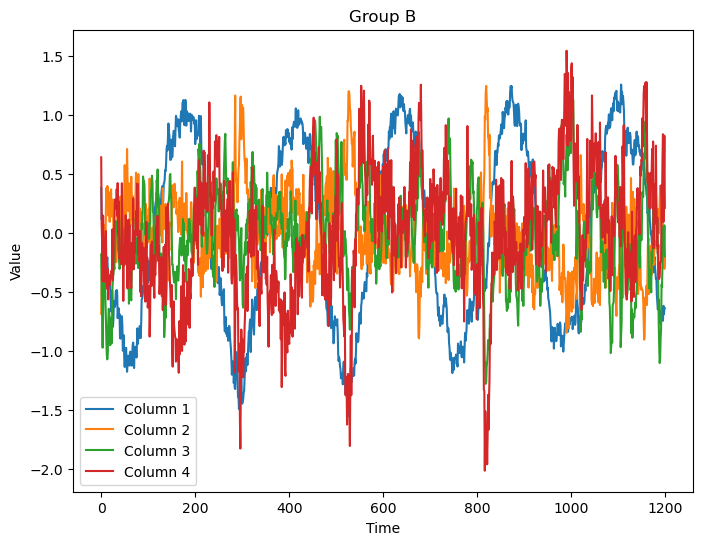

In [34]:
# https://www-sciencedirect-com.proxy.lib.umich.edu/science/article/pii/S1053811913010914
# visualize(fkt_filters[:,indices_greater],preprocessed_GroupA,preprocessed_GroupB)
# visualize(FKT_proj(reshaped_preprocessed_subjects,fkt_filters[:,resorted]).T,preprocessed_GroupA,preprocessed_GroupB)
# visualize(FKT_proj(reshaped_preprocessed_subjects,fkt_filters[:,resorted],method="covs"),preprocessed_GroupA,preprocessed_GroupB)
# visualize(FKT_proj(reshaped_preprocessed_subjects,fkt_filters[:, indices_greater],method="linreg").T,preprocessed_GroupA,preprocessed_GroupB)

visualize(FKT_proj(reshaped_preprocessed_subjects,fkt_filters[:,[0,1,-2,-1]],method="grouplassolinreg",alpha=1.9).T,preprocessed_GroupA,preprocessed_GroupB)
visualize(FKT_proj(reshaped_preprocessed_subjects,fkt_filters[:,[0,1,-2,-1]],method="lassolinreg",alpha=0.2).T,preprocessed_GroupA,preprocessed_GroupB)
# visualize(FKT_proj(reshaped_preprocessed_subjects,FKT_proj(reshaped_preprocessed_subjects,fkt_filters[:,resorted],method="lassolinreg",alpha=.4).T,method="grouplassolinreg",alpha=.2).T,preprocessed_GroupA,preprocessed_GroupB)
# visualize(FKT_proj(reshaped_preprocessed_subjects,fkt_filters[:,resorted],method="elasticlinreg",alpha=1, l1_ratio=0.2).T,preprocessed_GroupA,preprocessed_GroupB)

# visualize(FKT_proj(reshaped_preprocessed_subjects,fkt_filters[:,resorted],method="oscar",alpha=1,beta=0).T,preprocessed_GroupA,preprocessed_GroupB)

# visualize(fkt_filtersT[:,-10:],preprocessed_GroupA,preprocessed_GroupB)
# visualize(TSSF_filters,preprocessed_GroupA,preprocessed_GroupB, k=4)

#### Discrimination and Variance Explained by Filters

Number of FKT Filters/Eigenvectors: 4
F Ratio of FKT Variance/Total Variance: 0.014581951219511821
F Ratio of PCA Variance/Total Variance: 0.16986283253333107
F Ratio of FKT Variance/PCA Variance: 0.08584544954323955


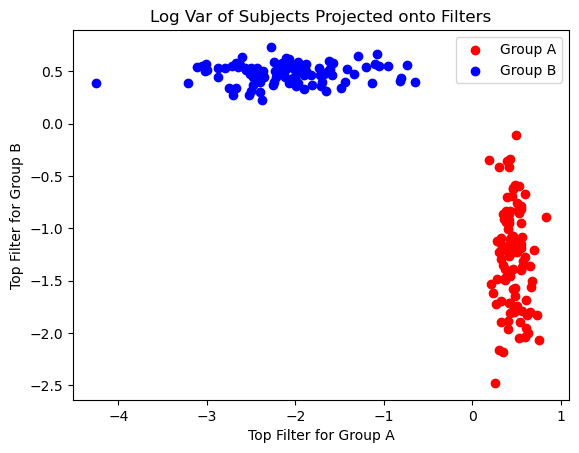

In [44]:
_, _ = f_test(fkt_filters[:,resorted], reshaped_preprocessed_subjects, preprocessed_GroupA, preprocessed_GroupB)


#### Computational Efficiency

### ICA

#### Single Subject IFA

In [55]:
def IFA(data, fkt_filters, visualize,n):
    data_projected = FKT_proj(data,fkt_filters,method="lassolinreg",alpha=.25, l1_ratio=0.9)
    ica = FastICA(n_components=n)
    IFA_components = ica.fit_transform(data_projected.T)
    IFA_mixing = ica.mixing_

    if visualize:
        plt.figure(figsize=(10, 6))
        num_rows = 2  # Number of rows in the subplot (image + histogram)
        for i in range(fkt_filters.shape[1]):
            # Plot the image
            plt.subplot(num_rows, fkt_filters.shape[1], i + 1)
            plt.imshow(fkt_filters[:, i:i + 1].T, aspect='auto', cmap='viridis', origin='lower')
            plt.colorbar(label='Amplitude')
            plt.title("Spatial Filters From FKT (Row {})".format(i + 1))

            # Plot the histogram
            plt.subplot(num_rows, fkt_filters.shape[1], fkt_filters.shape[1] + i + 1)
            plt.hist(fkt_filters[:, i], bins=20, color='blue', alpha=0.7)
            plt.title("Histogram of Filter {}".format(i + 1))

        plt.tight_layout()
        plt.show()

        plt.figure()
        plt.imshow(ica.mixing_,aspect='auto', cmap='viridis', origin='lower')
        plt.colorbar(label='Amplitude')
        plt.title("Mixing Matrix from ICA on FKT Projected")
        plt.show()
        
        plt.figure(figsize=(10, 6))
        num_rows = 2  # Number of rows in the subplot (image + histogram)
        for i in range(IFA_components.shape[1]):
            # Plot the image
            plt.subplot(num_rows, IFA_components.shape[1], i + 1)
            plt.imshow(IFA_components[:, i:i + 1].T, aspect='auto', cmap='viridis', origin='lower')
            plt.colorbar(label='Amplitude')
            plt.title("Independent Component from ICA on FKT Projected (Row {})".format(i + 1))

            # Plot the histogram
            plt.subplot(num_rows, IFA_components.shape[1], IFA_components.shape[1] + i + 1)
            plt.hist(IFA_components[:, i], bins=20, color='blue', alpha=0.7)
            plt.title("Histogram of Independent Filter {}".format(i + 1))
        plt.tight_layout()
        plt.show()
        
        # Create a figure and axes for subplots
        fig, axes = plt.subplots(IFA_components.shape[1], 1, figsize=(6, 4*IFA_components.shape[1]))
        for i in range(IFA_components.shape[1]):
            if IFA_components.shape[1] == 1:
                ax = axes
            else:
                ax = axes[i]
            ax.plot(IFA_mixing[:,i],label=f"IFA Mixing Vector for Component {i}")
            ax.legend()
        plt.xlabel("Time")
        plt.ylabel("Amplitude")
        plt.tight_layout()
        plt.show()

        plt.tight_layout()
        plt.show()
        
    return IFA_components, IFA_mixing, ica.mixing_


#### Applied to a Subject from Group A

/home/mrstats/zaisou/.conda/envs/IFA/lib/python3.11/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


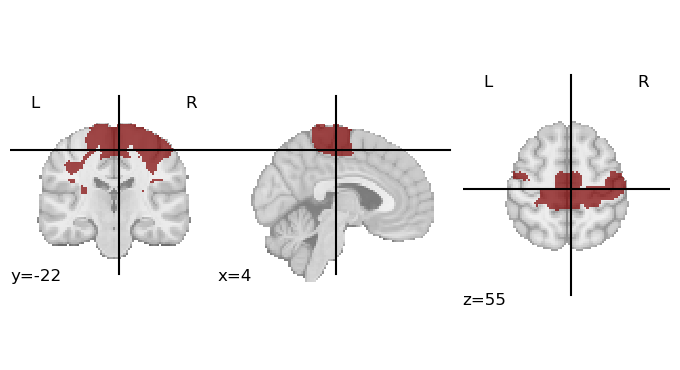

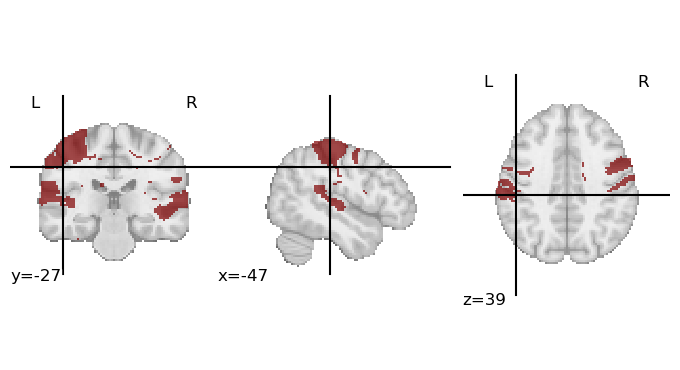

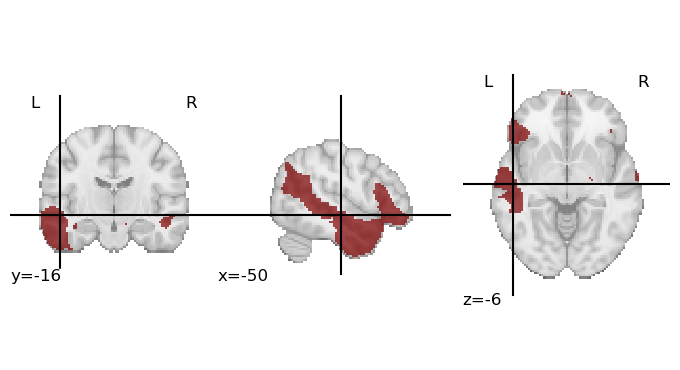

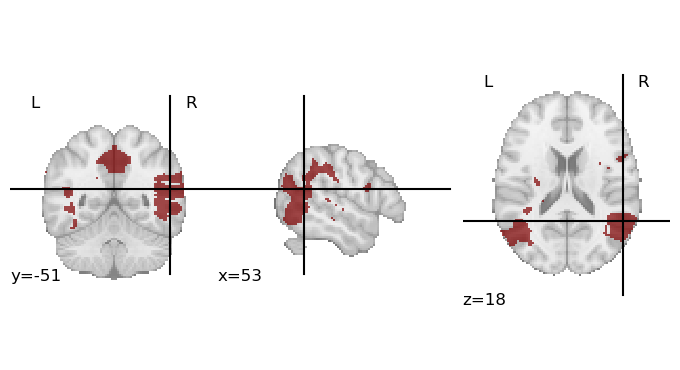

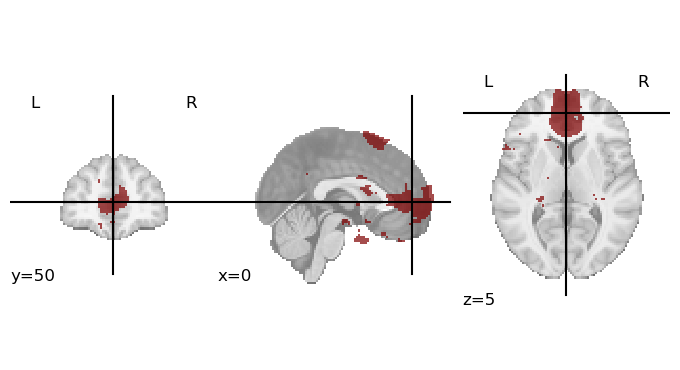

In [51]:
groupA_subject = preprocessed_GroupA[np.random.choice(range(preprocessed_GroupA.shape[0])),:,:]
groupA_IFAcomponents, _, _ = IFA(np.reshape(preprocessed_GroupA,(-1,208)), fkt_filters[:,resorted[-5:]],visualize=False,n=5)
regionsA = []
brain_stringsA = []
masked_compsA = []
for i in range(groupA_IFAcomponents.shape[1]):
    groupIFA_comp = groupA_IFAcomponents[:,i:i+1]
    std_groupIFA = (groupIFA_comp-np.mean(groupIFA_comp,keepdims=True,axis=0))/np.std(groupIFA_comp,axis=0)
    masked_comp = std_groupIFA*(np.abs(std_groupIFA)>2)
    masked_compsA.append(masked_comp)
    array = np.where(np.abs(std_groupIFA)>2)[0]+1
    regionsA.append(array)
    stringified_array = ' | '.join([f'(a == {num})' for num in array])
    final_string = f"(({stringified_array}))"
    brain_stringsA.append(final_string)
    view_labels(atlas, final_string)
masked_compsA = np.array(masked_compsA).T

#### Applied to a Subject from Group B

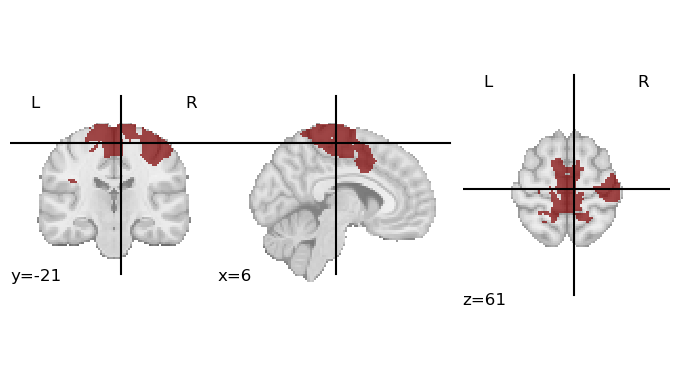

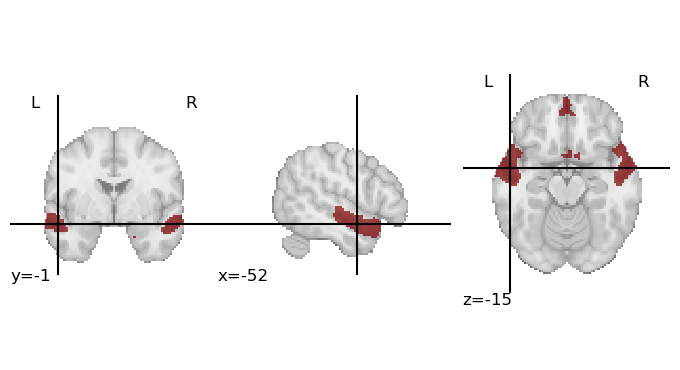

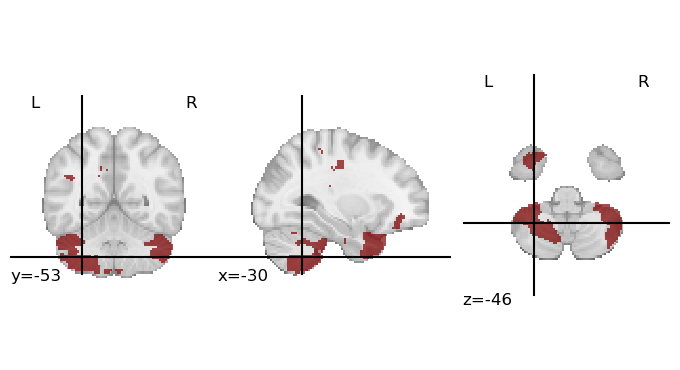

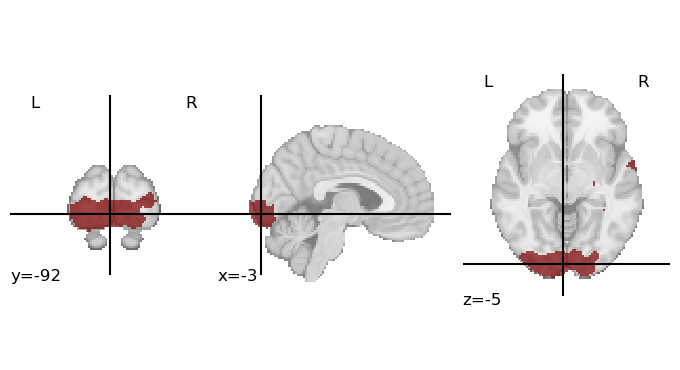

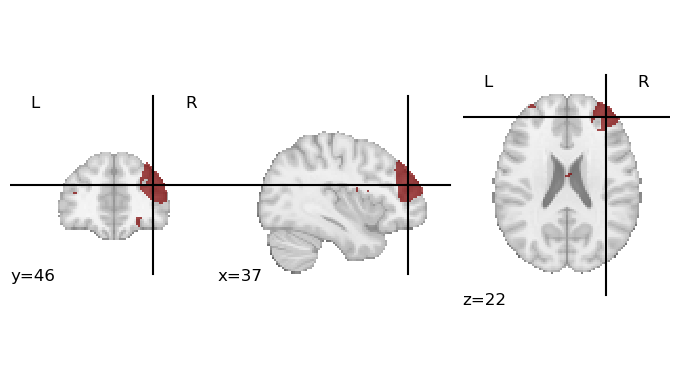

In [53]:
groupB_subject = preprocessed_GroupB[np.random.choice(range(preprocessed_GroupB.shape[0])),:,:]
groupB_IFAcomponents, _, _ = IFA(np.reshape(preprocessed_GroupB,(-1,208)), fkt_filters[:,resorted[0:5]],visualize=False,n=len(resorted[0:5]))
regionsB = []
brain_stringsB = []
masked_compsB = []
for i in range(groupB_IFAcomponents.shape[1]):
    groupIFA_comp = groupB_IFAcomponents[:,i:i+1]
    std_groupIFA = (groupIFA_comp-np.mean(groupIFA_comp,keepdims=True,axis=0))/np.std(groupIFA_comp,axis=0)
    masked_comp = std_groupIFA*(np.abs(std_groupIFA)>2.5)
    masked_compsB.append(masked_comp)
    array = np.where(np.abs(std_groupIFA)>2.5)[0]+1
    regionsB.append(array)
    stringified_array = ' | '.join([f'(a == {num})' for num in array])
    final_string = f"(({stringified_array}))"
    brain_stringsB.append(final_string)
    view_labels(atlas, final_string)
masked_compsB = np.array(masked_compsB).T

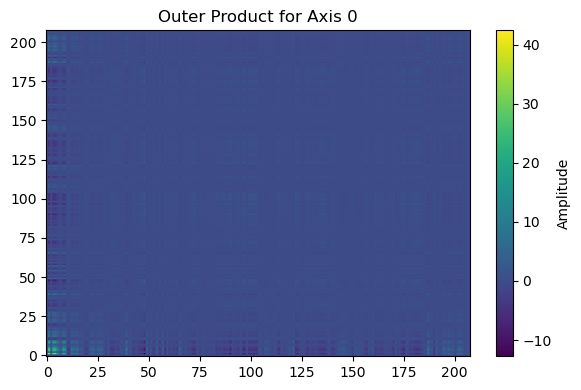

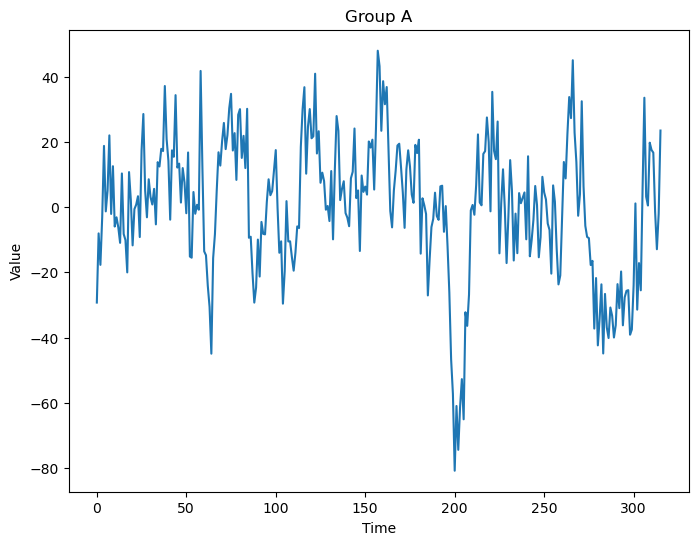

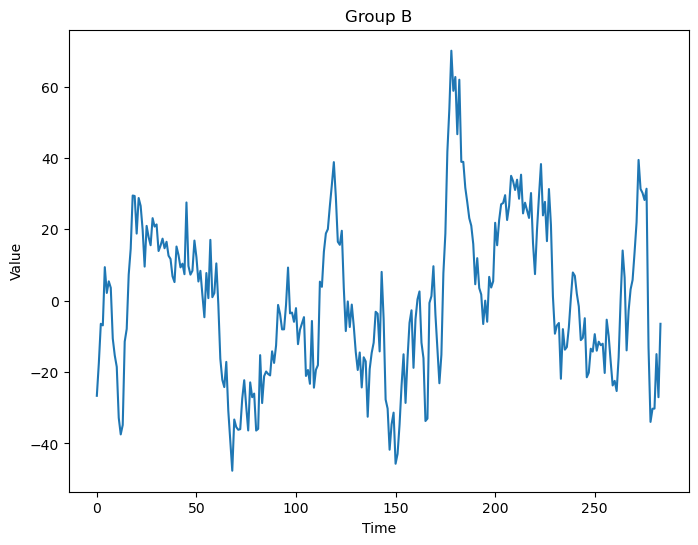

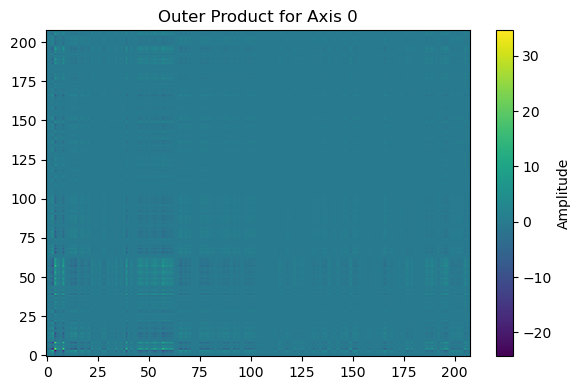

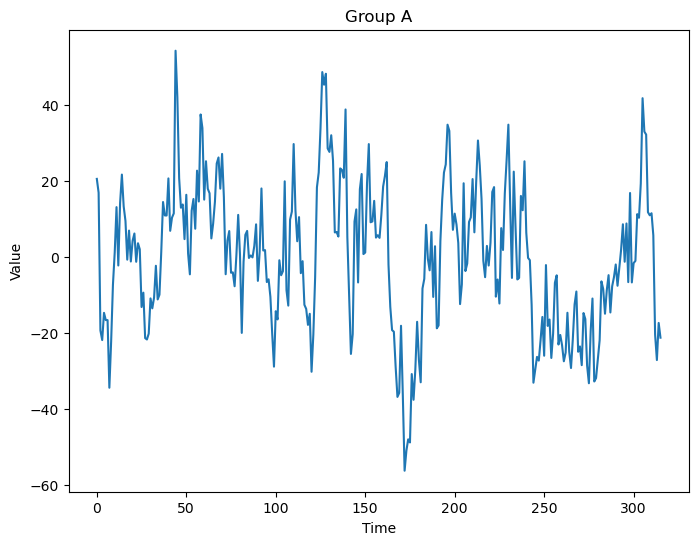

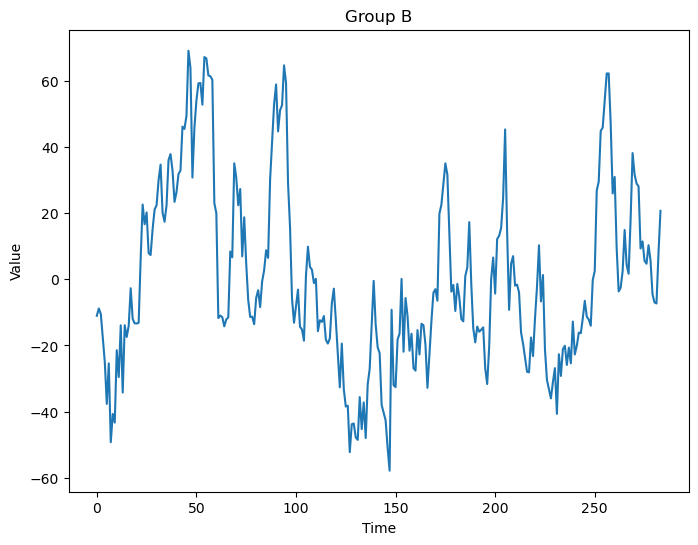

In [55]:
visualize(groupA_IFAcomponents[:,0:1],preprocessed_GroupA,preprocessed_GroupB)
visualize(groupB_IFAcomponents[:,0:1],preprocessed_GroupA,preprocessed_GroupB)


In [63]:
print(np.squeeze(masked_compsA)[:,0])

[ 0.         -6.51564061 -0.         -4.74402761 -4.8147281  -2.93964069
 -0.         -0.         -3.68013654 -3.04777896  0.          0.
 -0.         -0.         -0.         -0.         -0.         -0.
 -0.          0.          0.         -0.         -0.         -0.
 -0.         -0.         -0.         -0.         -0.          0.
 -0.          0.          0.          0.          0.          0.
 -0.         -0.          0.         -0.          0.         -0.
  0.          0.         -0.          0.          0.          0.
  0.         -0.          0.         -0.          0.          0.
 -0.          0.          0.         -0.          0.         -0.
  0.          0.          0.          0.          0.         -0.
 -0.          0.         -0.          0.          0.          0.
  0.          0.         -0.          0.         -0.         -0.
  0.          0.          0.          0.         -0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0. 

In [64]:
print(np.squeeze(masked_compsB)[:,0])

[-0.         -0.         -0.         -4.13687455  5.88336416  0.
  0.         -0.          4.12827479 -0.         -0.         -0.
 -0.         -0.         -0.         -0.         -0.         -0.
 -0.         -0.         -0.         -0.          0.         -0.
  0.         -0.          0.         -0.         -0.         -0.
  0.         -0.          0.         -0.          0.         -0.
  0.          0.         -0.          3.09603695 -0.          0.
  0.         -0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          3.21418029  0.          0.
  0.          0.          0.         -0.         -0.         -0.
 -0.         -0.         -0.         -0.         -0.          0.
 -0.         -0.          0.         -0.         -0.         -0.
 -0.         -0.         -0.         -0.         -0.          0.
 -0.         -0.         -0.         -0.         -0.         -0.
  0.          0.         

#### Group IFA

In [65]:
groupIFA_components, _, _ = IFA(reshaped_preprocessed_subjects,filters_tangent[:,indices_greater], visualize=False,n=9)
# regions = []
# brain_strings = []
# masked_comps = []
# for i in range(groupIFA_components.shape[1]):
#     groupIFA_comp = groupIFA_components[:,i:i+1]
#     std_groupIFA = (groupIFA_comp-np.mean(groupIFA_comp,keepdims=True,axis=0))/np.std(groupIFA_comp,axis=0)
#     masked_comp = std_groupIFA*(np.abs(std_groupIFA)>2)
#     masked_comps.append(masked_comp)
#     array = np.where(np.abs(std_groupIFA)>2)[0]+1
#     regions.append(array)
#     stringified_array = ' | '.join([f'(a == {num})' for num in array])
#     final_string = f"(({stringified_array}))"
#     brain_strings.append(final_string)
#     view_labels(atlas, final_string)
# masked_comps = np.array(masked_comps).T

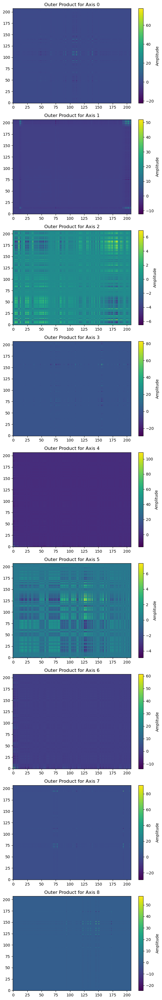

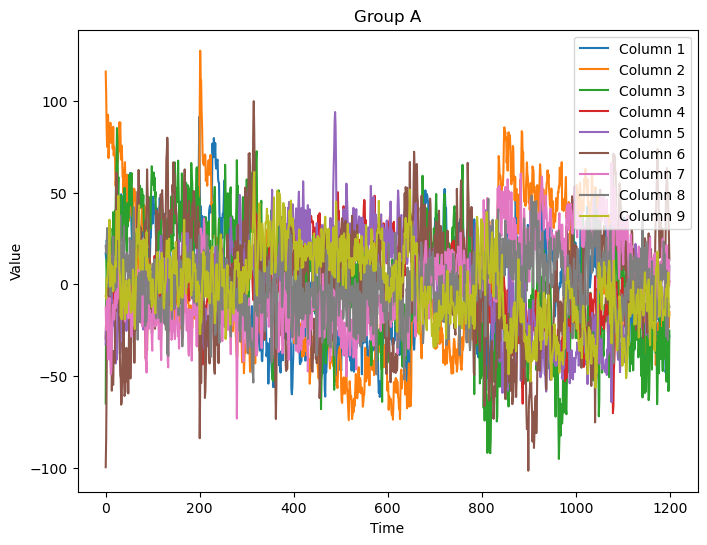

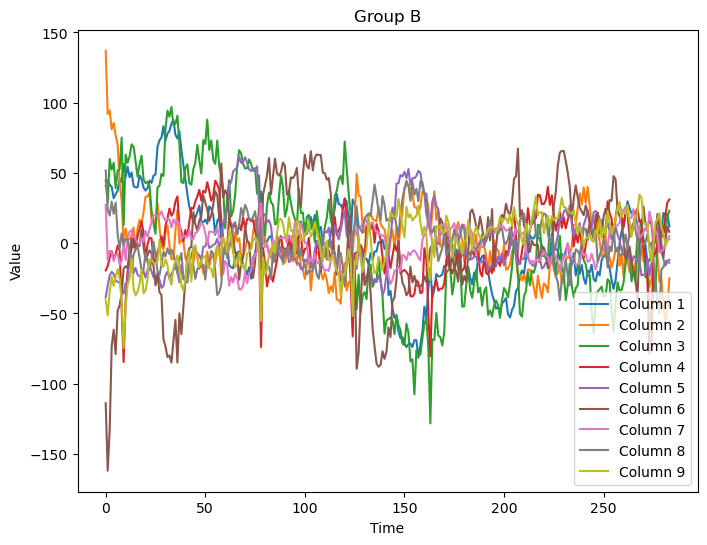

In [66]:
visualize(groupIFA_components,preprocessed_GroupA,preprocessed_GroupB)

In [111]:
for i in range(0,len(indices_greater)):
    print(groupIFA_components[:,i].T@RiemA@groupIFA_components[:,i])
    print(groupIFA_components[:,i].T@RiemB@groupIFA_components[:,i])

110.11259491852684
107.19168171460616
239.58068971983394
235.3382372162424
82.19182887183862
77.8072801467417
124.72086293560048
120.67910646404252
134.35283108962557
129.3675339474463
211.71406755428137
199.76784434314743
158.42954900851072
153.06079016513655
107.38611247381007
102.24600750196478
132.47206721565374
119.16340775792959
147.43176925039225
139.36868960332106


IndexError: index 10 is out of bounds for axis 1 with size 10

In [69]:
groupAs = []
groupBs = []
for i in range(0,9):
    diff = groupIFA_components[:,i].T@RiemA@groupIFA_components[:,i] - groupIFA_components[:,i].T@RiemB@groupIFA_components[:,i]
    print(groupIFA_components[:,i].T@RiemA@groupIFA_components[:,i])
    print(groupIFA_components[:,i].T@RiemB@groupIFA_components[:,i])
    if diff > 10:
        groupAs.append(i)
        # print(i,diff)
    elif diff < -10:
        groupBs.append(i)
        # print(i,diff)



89.26486476650122
132.35084858488756
125.40633755521473
126.4355112687382
162.40334995634953
235.6371476211417
68.66247015430164
93.77357706218487
73.57517310012625
83.75725344807921
225.81940097572485
300.39752696911876
55.86476703179948
62.29476158288371
63.31925276419025
77.44011128583543
57.67983822279571
68.67924383832008


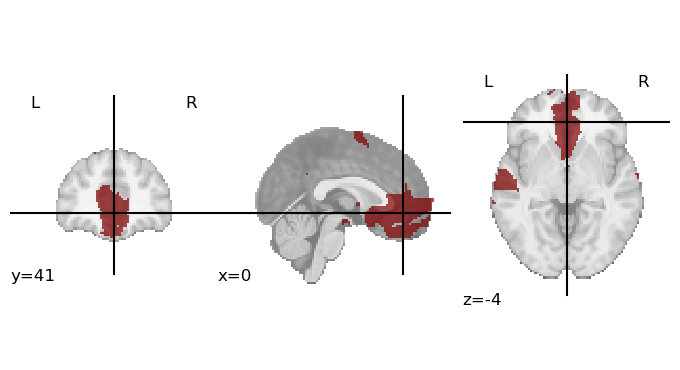

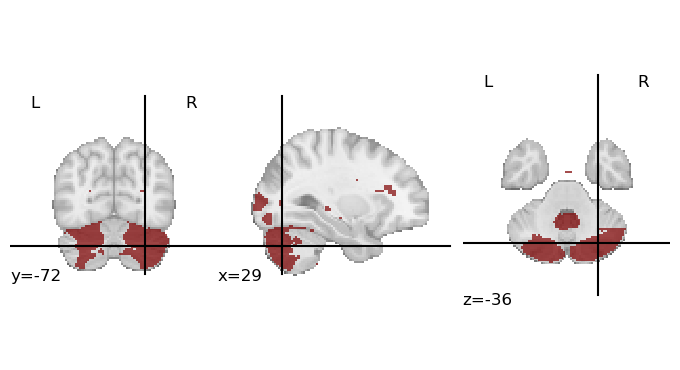

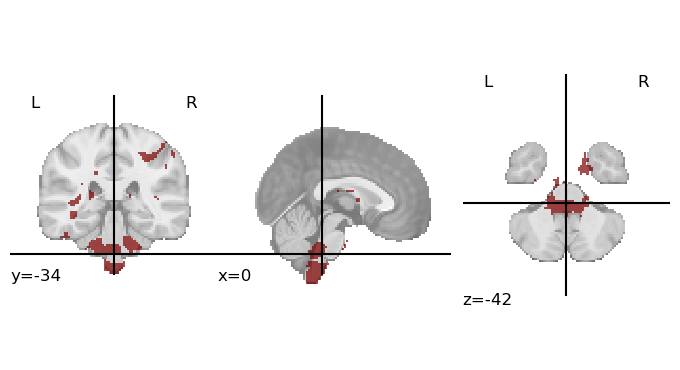

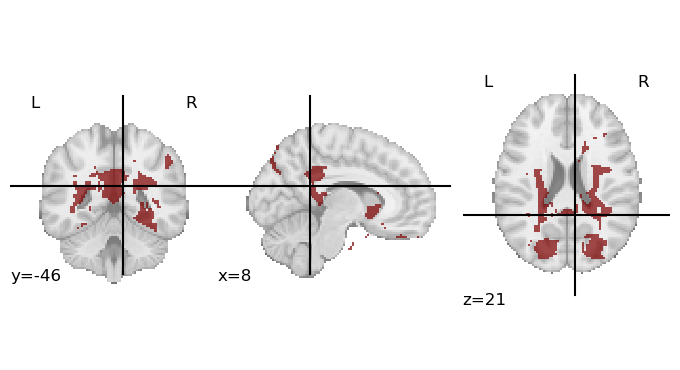

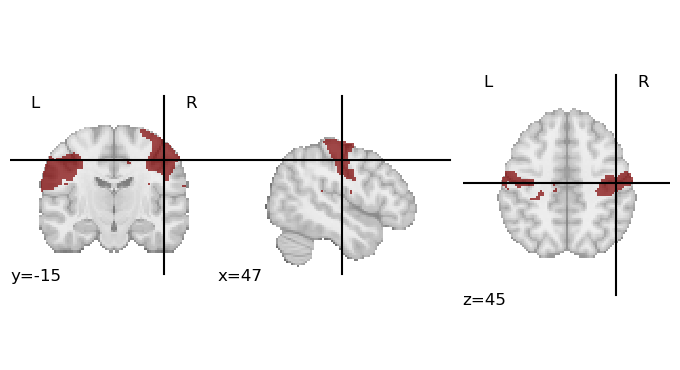

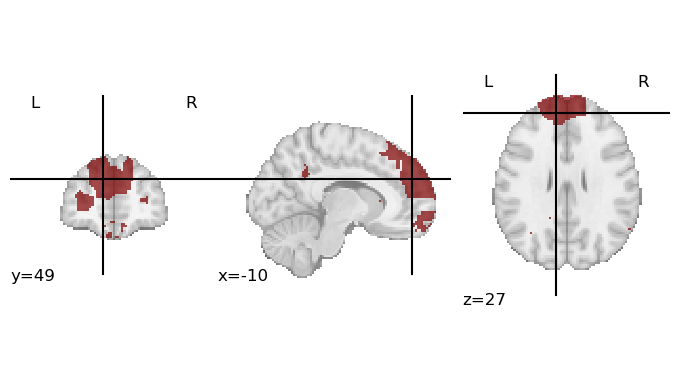

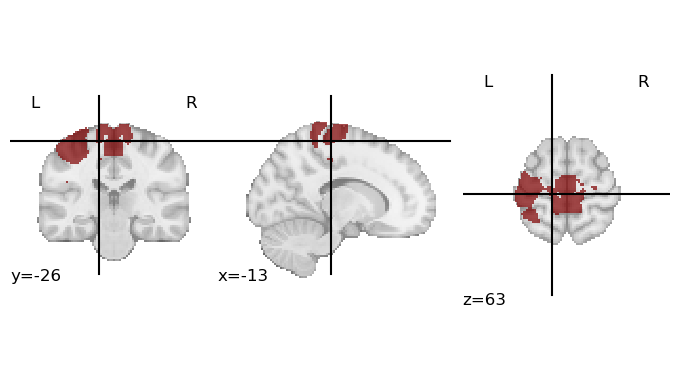

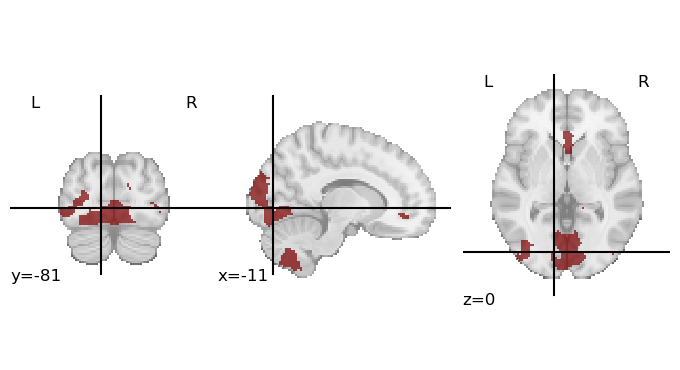

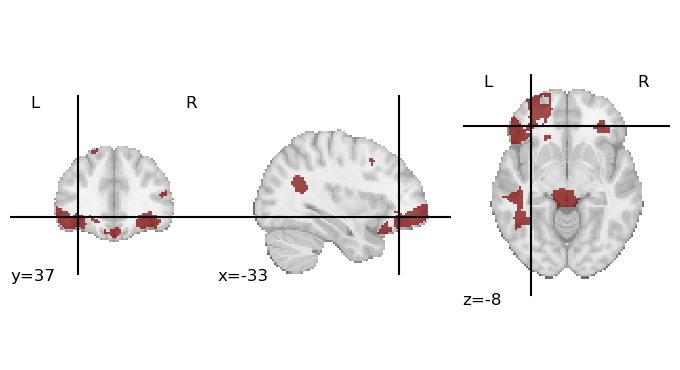

In [70]:
regions = []
brain_strings = []
masked_comps = []
for i in range(9):
    groupIFA_comp = groupIFA_components[:,i:i+1]
    std_groupIFA = (groupIFA_comp-np.mean(groupIFA_comp,keepdims=True,axis=0))/np.std(groupIFA_comp,axis=0)
    masked_comp = std_groupIFA*(np.abs(std_groupIFA)>2)
    masked_comps.append(masked_comp)
    array = np.where(np.abs(std_groupIFA)>2)[0]+1
    regions.append(array)
    stringified_array = ' | '.join([f'(a == {num})' for num in array])
    final_string = f"(({stringified_array}))"
    brain_strings.append(final_string)
    view_labels(atlas, final_string)
masked_comps = np.array(masked_comps).T

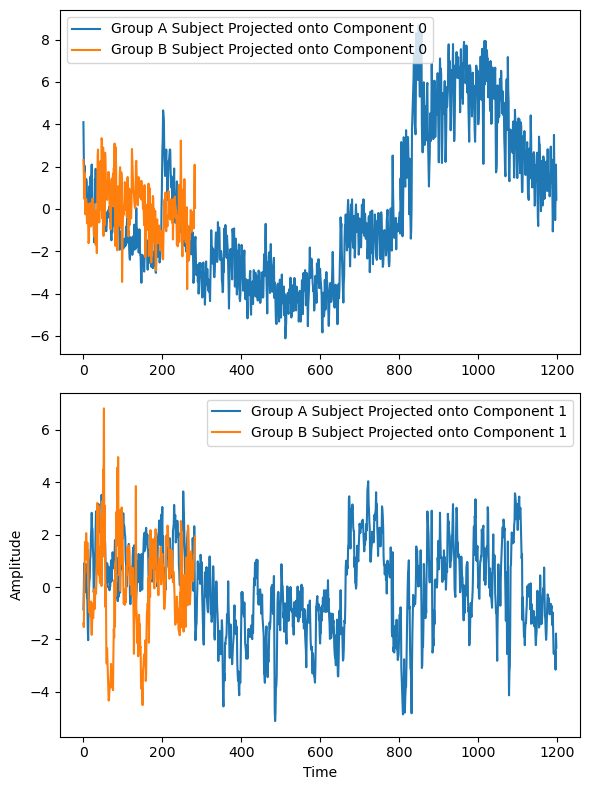

In [43]:
# Create a figure and axes for subplots
fig, axes = plt.subplots(groupIFA_components.shape[1], 1, figsize=(6, 4*groupIFA_components.shape[1]))

for i in range(groupIFA_components.shape[1]):
    if groupIFA_components.shape[1] == 1:
        ax = axes
    else:
        ax = axes[i]
    group_comp = groupIFA_components[:,i]
    std_fkt_ica = (group_comp-np.mean(group_comp,keepdims=True,axis=0))/np.std(group_comp,axis=0)
    masked_comp = group_comp*(np.abs(std_fkt_ica)>1.0)
    ax.plot(groupA_subject@masked_comp,label=f"Group A Subject Projected onto Component {i}")
    ax.plot(groupB_subject@masked_comp,label=f"Group B Subject Projected onto Component {i}")
    ax.legend()
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.tight_layout()
plt.show()

#### Comparison to Group ICA

/opt/anaconda3/2023.03/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


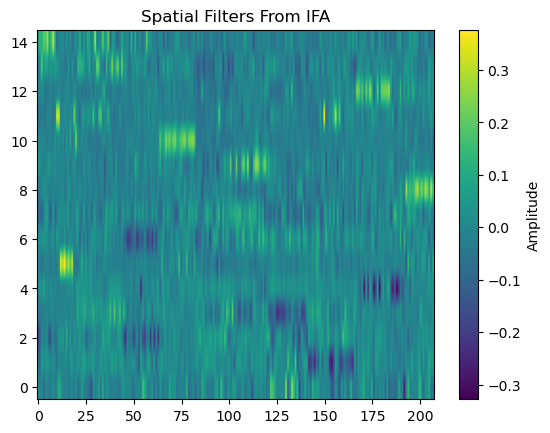

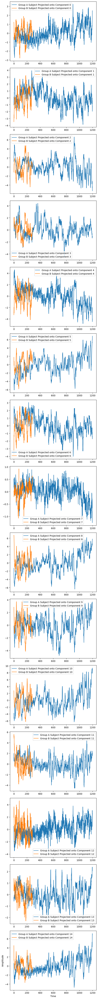

In [31]:
n = 15
ica = FastICA(n_components=n)
group_components = ica.fit_transform(reshaped_preprocessed_subjects.T)
group_mixing = ica.mixing_

plt.figure()
plt.imshow(group_components.T,aspect='auto', cmap='viridis', origin='lower')
plt.colorbar(label='Amplitude')
plt.title("Spatial Filters From IFA")
plt.show()

# Create a figure and axes for subplots
fig, axes = plt.subplots(group_components.shape[1], 1, figsize=(6, 4*group_components.shape[1]))

for i in range(group_components.shape[1]):
    if group_components.shape[1] == 1:
        ax = axes
    else:
        ax = axes[i]
    group_comp = group_components[:,i]
    std_fkt_ica = (group_comp-np.mean(group_comp,keepdims=True,axis=0))/np.std(group_comp,axis=0)
    masked_comp = group_comp*(np.abs(std_fkt_ica)>2.0)
    ax.plot(groupA_subject@masked_comp,label=f"Group A Subject Projected onto Component {i}")
    ax.plot(groupB_subject@masked_comp,label=f"Group B Subject Projected onto Component {i}")
    ax.legend()
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.tight_layout()
plt.show()

### Visualize in Brain

In [84]:
regions = []
brain_strings = []
masked_comps = []
for i in range(groupA_IFAcomponents.shape[1]):
    groupIFA_comp = groupA_IFAcomponents[:,i:i+1]
    std_groupIFA = (groupIFA_comp-np.mean(groupIFA_comp,keepdims=True,axis=0))/np.std(groupIFA_comp,axis=0)
    masked_comp = std_groupIFA*(np.abs(std_groupIFA)>2.5)
    masked_comps.append(masked_comp)
    array = np.where(np.abs(std_groupIFA)>2.5)[0]+1
    regions.append(array)
    stringified_array = ' | '.join([f'(a == {num})' for num in array])
    final_string = f"(({stringified_array}))"
    brain_strings.append(final_string)
    view_labels(atlas, final_string)
masked_comps = np.array(masked_comps).T

NameError: name 'group_IFAcomponents' is not defined

/home/mrstats/zaisou/.conda/envs/IFA/lib/python3.11/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/home/mrstats/zaisou/.conda/envs/IFA/lib/python3.11/site-packages/nilearn/image/resampling.py:293: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn(


/home/mrstats/zaisou/.conda/envs/IFA/lib/python3.11/site-packages/nilearn/plotting/html_document.py:102: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn(



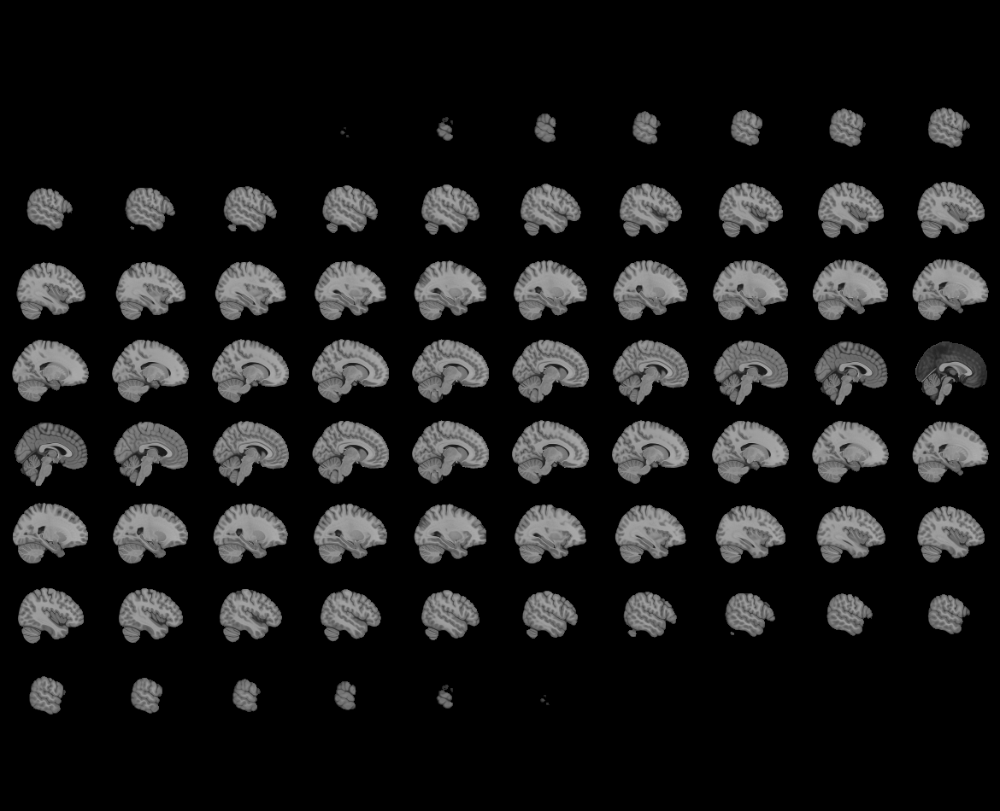
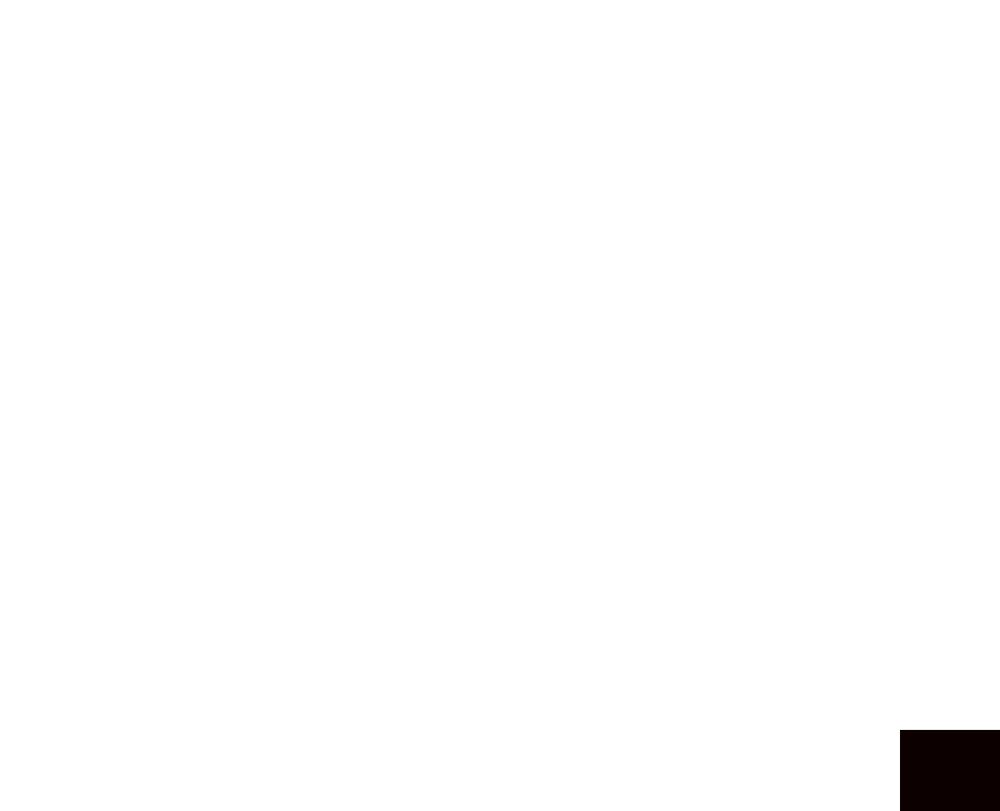

In [634]:
view  = nplot.view_img(nimg.math_img(brain_strings[0], a=atlas))
view

In [536]:
del view

In [115]:
print(np.where(np.abs(masked_comps[:,0])>0))
print(groupB_parcels)

(array([ 91, 146]),)
[ 91 146]


### Unsupervised IFA

In [52]:
average = np.mean(np.vstack((groupA_covs,groupB_covs)),axis=0)
covs = []
for sub in preprocessed_GroupA:
    covs.append(regcov(sub, gamma=0.00000, sc=1.0, beta=.9, ddof=1.0, groundtruth=average))

for sub in preprocessed_GroupB:
    covs.append(regcov(sub, gamma=0.00000, sc=1.0, beta=.9, ddof=1.0, groundtruth=average))

covs = np.array(covs)

n_matrices = covs.shape[0]
all = np.zeros((n_matrices, n_matrices))
for i in range(n_matrices):
    for j in range(i, n_matrices):
        Cs = covs[j]
        oh = covs[i]

        eigs, _ = FKT(Cs, oh,preprocessed_GroupA, auto_select=True, threshold=.8, visualize=False, gamma=0.00, l2=0.01,l3=0.4)
        print(i,j, eigs)
        all[i, j] = np.sum(eigs)
        all[j, i] = all[i, j]

sns.heatmap(all, cmap='RdBu_r')

0 0 []
0 1 []
0 2 []
0 3 []
0 4 []
0 5 []
0 6 []
0 7 []
0 8 []
0 9 []
0 10 []
0 11 []
0 12 []
0 13 []
0 14 []
0 15 []
0 16 []
0 17 []
0 18 []
0 19 []
0 20 []
0 21 []
0 22 []
0 23 []
0 24 []
0 25 []
0 26 []
0 27 []
0 28 []
0 29 []
0 30 []
0 31 []
0 32 []
0 33 []
0 34 []
0 35 []
0 36 []
0 37 []
0 38 []
0 39 []
0 40 []
0 41 []
0 42 []
0 43 []
0 44 []
0 45 []
0 46 []
0 47 []
0 48 []
0 49 []
0 50 []
0 51 []
0 52 []
0 53 []
0 54 []
0 55 []
0 56 []
0 57 []
0 58 []
0 59 []
0 60 []
0 61 []
0 62 []
0 63 []
0 64 []
0 65 []
0 66 []
0 67 []
0 68 []
0 69 []
0 70 []
0 71 []
0 72 []
0 73 []
0 74 []
0 75 []
0 76 []
0 77 []
0 78 []
0 79 []
0 80 []
0 81 []
0 82 []
0 83 []
0 84 []
0 85 []
0 86 []
0 87 []
0 88 []
0 89 []
0 90 []
0 91 []
0 92 []
0 93 []
0 94 []
0 95 []
0 96 []
0 97 []
0 98 []
0 99 []
0 100 []
0 101 []
0 102 []
0 103 []
0 104 []
0 105 []
0 106 []
0 107 []
0 108 []
0 109 []
0 110 []
0 111 []
0 112 []
0 113 []
0 114 []
0 115 []
0 116 []
0 117 []
0 118 []
0 119 []
0 120 []
0 121 []
0 122 []
0 1

KeyboardInterrupt: 

/opt/anaconda3/2023.03/lib/python3.10/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


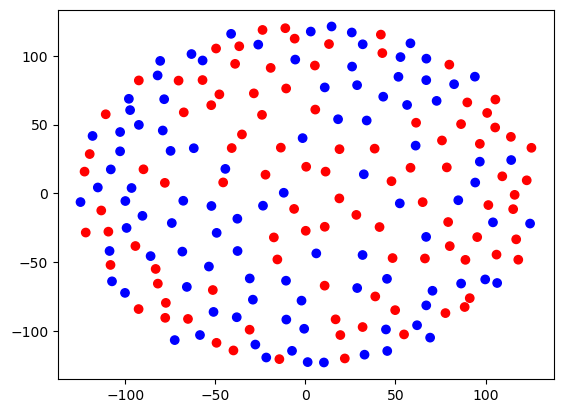

In [69]:
mds = MDS(n_components=2, dissimilarity='precomputed')
embedding = mds.fit_transform(all)

colors = ['blue' for i in range(len(embedding))]
for sub in range(preprocessed_GroupA.shape[0]):
    colors[sub] = 'red'

# Visualize the points with labels in 3D
fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')
# ax.scatter(embedding[:, 0], embedding[:, 1], embedding[:, 2], c=colors)

# # Customize the plot
# ax.set_title('MDS Visualization in 3D with Odd/Even Colors')
# ax.set_xlabel('MDS Dimension 1')
# ax.set_ylabel('MDS Dimension 2')
# ax.set_zlabel('MDS Dimension 3')

plt.scatter(embedding[:, 0], embedding[:, 1], c=colors)

plt.show()